# enter model path

In [1]:
# Either enter a direct path to a checkpoint
# filepath = '../log/geometric_graph/grid/checkpoints/best_model-step=26783.ckpt'

# Or enter a base path and version number to load the latest checkpoint
filepath = None
base_path = '../log/experiment-resultss'
# base_path = '../log/test'
# base_path = '../log/zooi'

# sort = 'alphabetical'
sort = 'modification_time'

device = 'cuda'
version = 2
sub_version = 0
filepath = None

# import packages and load model

In [2]:
import sys
sys.path.append('../')
import os
from importlib import reload

import egnn
reload(egnn)
import models
reload(models)
import pools
reload(pools)
import utils
reload(utils)
import utils.utils
reload(utils.utils)
import data
import data.datasets
reload(data)
reload(data.datasets)

from utils.visualize import coord2scatter, plot_edge_index, plot_trend
from utils.utils import coord_invariant_rec_loss, damage_coord, compute_edge_index, ot_assignment
from models import FixedTargetGAE

from pytorch_lightning.utilities.model_summary import ModelSummary
%matplotlib widget
import matplotlib.animation as animation
import matplotlib.pyplot as plt
import torch

from tqdm.auto import tqdm

In [4]:
load_model(-1, 0, base_path='../log/experiment-resultss', sort='a')
# load_model(-1, base_path='../log/test', sort='a')
# load_model(112, base_path='../log/test')
# load_model(filepath=filepath)

Loading model: -ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn
../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=21964.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


In [3]:
def load_model(version=version, sub_version=sub_version, base_path=base_path, sort=sort, filepath=filepath):
    import models
    reload(models)
    from models import FixedTargetGAE
    
    global model, coord_dim
    if filepath is None:
        files = os.listdir(base_path)
        files = [file for file in files if file[-4:] != '.png']
        if sort == 'alphabetical':
            files.sort()
        else:
            files.sort(key=lambda x: os.path.getmtime(f'{base_path}/{x}'))
        model_name = files[version]
        print(f'Loading model: {model_name}')
        path = f'{base_path}/{model_name}'
        folders = os.listdir(path)
        if 'checkpoints' in folders:
            filepath = f'{path}/checkpoints/'
        else:
            filepath = f'{path}/version_{sub_version}/checkpoints/'
        filepath += os.listdir(filepath)[0]
        print(filepath)

    model = FixedTargetGAE.load_from_checkpoint(filepath).to(device)
    coord_dim = model.encoder.coord_dim
    print(ModelSummary(model, max_depth=1))

In [369]:
# filters = ['Grid2d', '-as simplex', '-de', '-des 5', '-bsc 0 8']
filters = ['-ds Grid2d', 'ot', 'simplex']
neg_filters = ['ot_p', 'bc', 're']
# neg_filters = []

files = os.listdir(base_path)
files = [file for file in files if file[-4:] != '.png']
if sort == 'alphabetical':
    files.sort()
else:
    files.sort(key=lambda x: os.path.getmtime(f'{base_path}/{x}'))

for i, file in enumerate(files):
    if not all([filter in file for filter in filters]): continue
    if any([filter in file for filter in neg_filters]): continue
    print(f'{i}: {file}')
    new_path = f'{base_path}/{file}'
    folders = os.listdir(new_path)
    if 'checkpoints' in folders:
        new_path += '/checkpoints'
        checkpoints = os.listdir(new_path)[0]
        for checkpoint in checkpoints:
            print(f'    {checkpoint}')
    else:
        for folder in folders:
            if 'version' in folder and '.png' not in folder:
                new_path += f'/{folder}/checkpoints'
                if os.path.exists(new_path):
                    checkpoint = os.listdir(new_path)[0]
                    print(f'  {folder}:')
                    print(f'    {checkpoint}')

8: -ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42
  version_0:
    best_model-step=26537.ckpt
9: -ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42 -nt nn
  version_0:
    best_model-step=36199.ckpt


In [5]:
def get_model(name, version):
    import models
    reload(models)
    from models import FixedTargetGAE
    global model, coord_dim
    try:
        model = FixedTargetGAE.load_from_checkpoint(name).to(device)
    except:
        path = f'{base_path}/{name}/version_{version}/checkpoints/'
        checkpoint = os.listdir(path)[0]
        print(f'Loading model: {path}{checkpoint}')
        model = FixedTargetGAE.load_from_checkpoint(f'{path}{checkpoint}').to(device)
    coord_dim = model.encoder.coord_dim
    print(ModelSummary(model, max_depth=1))

In [6]:
def pick_model():
    import models
    reload(models)
    from models import FixedTargetGAE
    global model, coord_dim
    print(base_path)
    files = os.listdir(base_path)
    if sort == 'alphabetical':
        files.sort()
    else:
        files.sort(key=lambda x: os.path.getmtime(f'{base_path}/{x}'))
    print('Pick a model:')
    for i, file in enumerate(files):
        print(f'{i}: {file}')
    print()
    version = int(input())
    model_name = files[version]
    print(f'Loading model: {model_name}')
    path = f'{base_path}/{model_name}'
    folders = os.listdir(path)
    if 'checkpoints' in folders:
        filepath = f'{path}/checkpoints/'
    else:
        print('Pick a subversion:')
        for i, folder in enumerate(folders):
            print(f'{i}: {folder}')
        print()
        sub_version = int(input())
        filepath = f'{path}/version_{sub_version}/checkpoints/'
    filepath += os.listdir(filepath)[0]
    print(filepath)

    model = FixedTargetGAE.load_from_checkpoint(filepath).to(device)
    coord_dim = model.encoder.coord_dim
    print(ModelSummary(model, max_depth=1))

In [6]:
re_import_packages()
load_model()

NameError: name 'os' is not defined

In [46]:
# %load_ext tensorboard
# %tensorboard --logdir "{path}"

## notebook utils

In [356]:
from utils.utils import local_loss, sliced_ot_loss, ot_assignment


box_dim = 1.0

coord_dim = model.encoder.coord_dim

def get_title(time_step, coord = None, edge_index = None):
    if edge_index is None:
        edge_index = model.edge_index
    title = '$t=%d$' % time_step
    if coord is not None:
        if model.loss_fn == 'local' or model.loss_fn == 'local_enp':
            loss = coord_invariant_rec_loss(coord, model.target_coord)
            dist_loss, angle_loss, nb_loss = local_loss(coord, model.target_coord, edge_index)
            title += '$\quad \mathcal{L}_{\mathsf{INV}}=%.5f; \mathcal{L}_{local}=%.5f + %5f + %5f = %5f$' % (loss, dist_loss, angle_loss, nb_loss, dist_loss + angle_loss + nb_loss)
        elif model.loss_fn == 'ot' or model.loss_fn == 'ot_p':
            loss_ot, penalty = sliced_ot_loss(coord, model.target_coord, penalty=model.loss_fn == 'ot_p', edge_index=edge_index, penalty_dist=model.penalty_distance)
            title += '$\quad \mathcal{L}_{\mathsf{OT}}=%.5f + %5f = %5f$' % (loss_ot, penalty, loss_ot + penalty)
        else:
            loss = coord_invariant_rec_loss(coord, model.target_coord)
            title += '$\quad \mathcal{L}_{\mathsf{INV}}=%.5f$' % loss
    return title

# initial and target geometric graphs

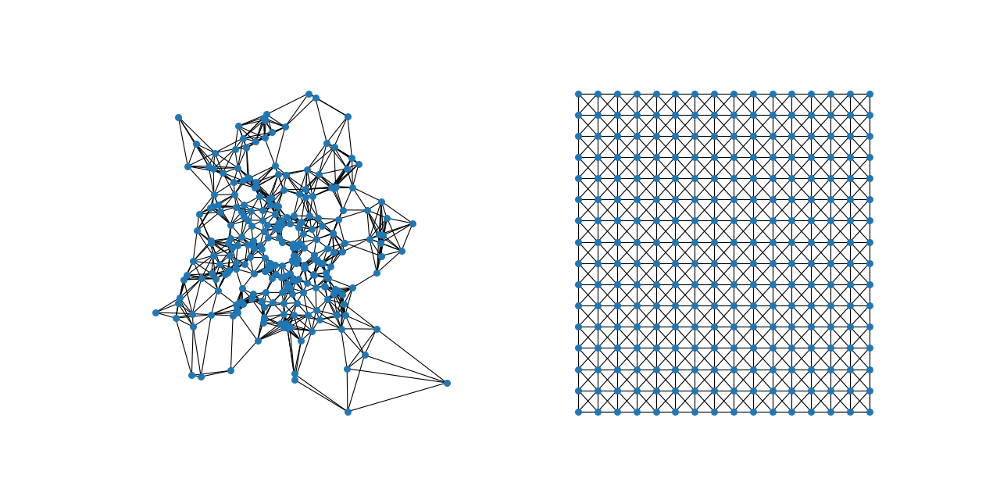

In [8]:
fig = plt.figure(figsize=(16, 8), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(122, projection='3d' if coord_dim == 3 else None)

# init_coord = torch.empty(model.pool.num_nodes, model.pool.coord_dim, dtype=torch.float64).normal_(std=model.pool.std).to(device)
init_coord = model.init_coord
target_coord = model.target_coord

# edge_index = compute_edge_index(model.edge_index, init_coord, torch.LongTensor([init_coord.size(0)]), True, False, distance=None, n_neighbours=4)
edge_index = compute_edge_index(model.edge_index, init_coord, torch.LongTensor([init_coord.size(0)]), True, False, distance=0.4, min_neighbours=4, n_neighbours=8)
edge_index_target = compute_edge_index(model.edge_index, target_coord, torch.LongTensor([init_coord.size(0)]), True, False, distance=0.4, min_neighbours=4, n_neighbours=8)

# coord2scatter(init_coord, title="t=0", transparent=True, ax=ax1, zero_center=False)
plot_edge_index(edge_index, ax=ax1, coord=init_coord)#, title="Locally connected initial")
# coord2scatter(target_coord, title="Target", transparent=True, ax=ax2, zero_center=False)
plot_edge_index(edge_index_target, ax=ax2, coord=target_coord)#, title="Locally connected target")

# fig.savefig('../../gifs and pictures/initial_target_local.png', dpi=300)

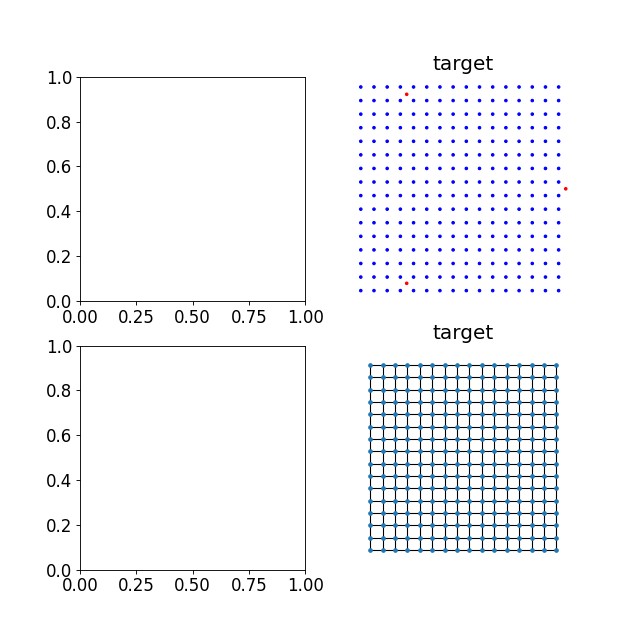

In [32]:
fig = plt.figure(figsize=(8, 8), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

relative_edges = model.relative_edges

if relative_edges:
    if model.fixed_init_coord:
        edge_index = compute_edge_index(model.edge_index, model.init_coord, torch.LongTensor([model.init_coord.shape[0]]), relative_edges, False, distance=model.edge_distance, n_neighbours=model.edge_num, min_neighbours=model.min_edges)
    target_edge_index = compute_edge_index(model.edge_index, model.target_coord, torch.LongTensor([model.target_coord.shape[0]]), relative_edges, False, distance=model.edge_distance, n_neighbours=model.edge_num, min_neighbours=model.min_edges)
else:
    edge_index = model.edge_index
    target_edge_index = model.edge_index
# edge_index = ot_assignment(model.init_coord, model.target_coord, pb=True)

if model.fixed_init_coord:
    if model.structured_seed:
        coord2scatter(model.init_coord, title=get_title(0, model.init_coord, edge_index), transparent=True, ax=ax1, zero_center=False, show_anchors=True, n_anchors=model.encoder.anchor_feat.size(0))
    elif model.beacon:
        coord2scatter(model.init_coord, title=get_title(0, model.init_coord, edge_index), transparent=True, ax=ax1, zero_center=False, show_anchors=True, anchor_coords=model.anchor_coords)
    else:
        coord2scatter(model.init_coord, title=get_title(0, model.init_coord, edge_index), transparent=True, ax=ax1, zero_center=False)
    plot_edge_index(edge_index, coord=model.init_coord, title=get_title(0, model.init_coord), ax=ax2, node_size=10)
if model.structured_seed:
    coord2scatter(model.target_coord, title='target', transparent=True, ax=ax3, zero_center=False, show_anchors=True, n_anchors=model.encoder.anchor_feat.size(0))
elif model.beacon:
    coord2scatter(model.target_coord, title='target', transparent=True, ax=ax3, zero_center=False, show_anchors=True, anchor_coords=model.anchor_coords)
else:
    coord2scatter(model.target_coord, title='target', transparent=True, ax=ax3, zero_center=False)
plot_edge_index(target_edge_index, coord=model.target_coord, title='target', ax=ax4, node_size=10)

In [28]:
load_model(50)

Loading model: -ds Grid2d -sdg 0.05 -bsc 0 8 2000 16 -l ot_p -apd -bc -as simplex -nt nn -an -otp -ric --seed 123
../log/experiment-resultss/-ds Grid2d -sdg 0.05 -bsc 0 8 2000 16 -l ot_p -apd -bc -as simplex -nt nn -an -otp -ric --seed 123/version_0/checkpoints/best_model-step=25717.ckpt
Beacon structure: simplex, Anchor distance: 0.25
No structured seed
torch.Size([256, 2])
Beacon - register anchor coords
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.7 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.7 K     Trainable params
0         Non-trainable params
8.7 K     Total params
0.035     Total estimated model params size (MB)


In [351]:
pick_model()

../log/experiment-resultss
Pick a model:
0: -ds Cube -sdg 0.05 -rdg 1.0 -bsc 0 2 -l local_enp -pd 0.2 -ss -as corners -ad 0.15 -asc 0.5 -an --seed 42
1: -ds Cube -sdg 0.05 -rdg 1.0 -bsc 0 2 -l local_enp -pd 0.2 -ss -as corners -ad 0.15 -asc 0.5 -an --seed 42 -nt nn
2: -ds Grid2d -bsc 0 1 -l local -ss -as corners -an --seed 42
3: -ds Grid2d -bsc 0 1 -l local -ss -as corners -an --seed 42 -nt nn
4: -ds Grid2d -bsc 0 1 -l local -ss -as corners -asc 1.5 -an --seed 42
5: -ds Grid2d -bsc 0 1 -l local -ss -as corners -asc 1.5 -an --seed 42 -nt nn
6: -ds Grid2d -bsc 0 1 -l local -ss -as simplex -an --seed 42
7: -ds Grid2d -bsc 0 1 -l local -ss -as simplex -an --seed 42 -nt nn
8: -ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42
9: -ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42 -nt nn
10: -ds Grid2d -bsc 0 1 -l ot_p -bc -as simplex -re -de -des 5 -en 4 --seed 42
11: -ds Grid2d -bsc 0 1 -l ot_p -bc -as simplex -re -de -des 5 -en 4 --seed 42 -nt nn
12: -ds Grid2d -bsc 0 1 -l ot_p -bc -as s

# transition rule dynamics animation

In [107]:
model.penalty_distance

0.21693050861358643

In [ ]:
# -4 '-ds Torus -bsc 0 8 2000 16 -l local -an -at undirected -ss -as corners -ad 0.5' works
# -1 '-ds Torus -bsc 0 8 2000 16 -l local_enp -an -at undirected -ss -as corners -ad 0.5' works
# -6, -5, -2 grids

Loading model: -ds Grid2d -sdg 0.05 -rdg 1.0 -bsc 0 8 2000 16 4000 32 -pats 800 -an --seed 42
../log/experiment-resultss/-ds Grid2d -sdg 0.05 -rdg 1.0 -bsc 0 8 2000 16 4000 32 -pats 800 -an --seed 42/version_0/checkpoints/best_model-step=14460.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.5 K     Trainable params
0         Non-trainable params
8.5 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:00<00:00, 52.50it/s]


min: 5.44e-11, mean: 3.60e-08, max: 1.31e-07
tensor([[ 0.5888, -0.8083],
        [-0.8083, -0.5888]], device='cuda:0', dtype=torch.float64)


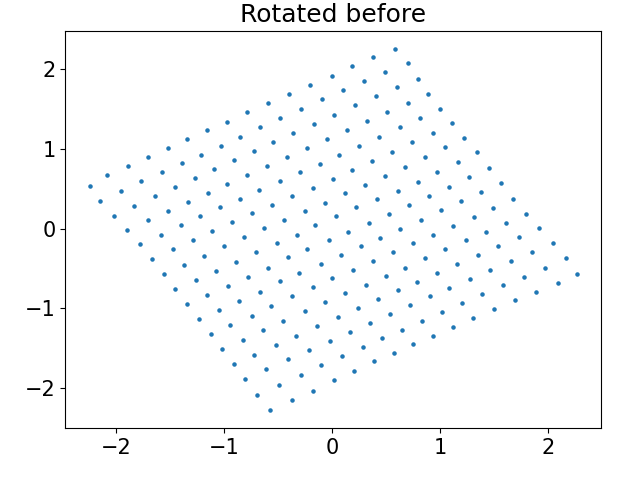

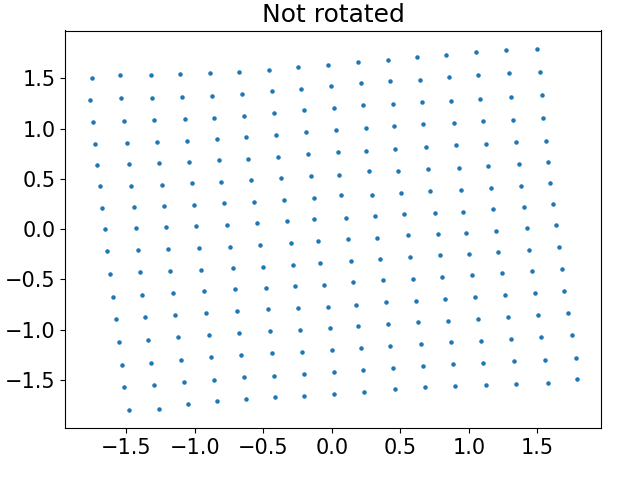

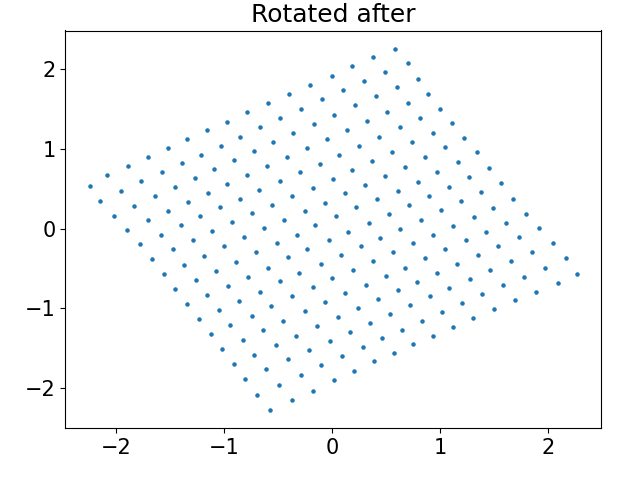

In [417]:
dtype = torch.float64
# init_coord = torch.empty(model.pool.num_nodes, model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
init_coord = None

# load_model(112, base_path='../log/test', sort='a')
load_model(-6, 0, base_path='../log/experiment-resultss', sort='a')

steps = 50

(coord_rot, _, _), rotation, rotated_anchor_coords = model.eval(init_coord=init_coord, n_steps=steps, rotate=True, return_inter_states=False, dtype=dtype)
if model.structured_seed:
    coord2scatter(coord_rot, title="Rotated before", show_anchors=True, n_anchors=model.anchor_feat.size(0))
elif model.beacon:
    coord2scatter(coord_rot, title="Rotated before", show_anchors=True, anchor_coords=rotated_anchor_coords)
else:
    coord2scatter(coord_rot, title="Rotated before")

(coord, _, _) = model.eval(init_coord=init_coord, n_steps=steps, rotate=False, return_inter_states=False, dtype=dtype)
if model.structured_seed:
    coord2scatter(coord, title="Not rotated", show_anchors=True, n_anchors=model.anchor_feat.size(0))
elif model.beacon:
    coord2scatter(coord, title="Not rotated", show_anchors=True, anchor_coords=model.anchor_coords)
else:
    coord2scatter(coord, title="Not rotated")

rotated_coord = torch.matmul(rotation, coord.T).T
if model.structured_seed:
    coord2scatter(rotated_coord, title="Rotated after", show_anchors=True, n_anchors=model.anchor_feat.size(0))
elif model.beacon:
    rotated_anchors = torch.matmul(rotation, model.anchor_coords.T).T
    coord2scatter(rotated_coord, title="Rotated after", show_anchors=True, anchor_coords=rotated_anchors)
else:
    coord2scatter(rotated_coord, title="Rotated after")

diff = torch.abs(coord_rot - rotated_coord).detach()
print(f'min: {diff.min().item():.2e}, mean: {diff.mean().item():.2e}, max: {diff.max().item():.2e}')
print(rotation)

In [153]:
import matplotlib
matplotlib.pyplot.close()

In [135]:
reload(utils.utils)
from utils.utils import sliced_ot_loss

In [337]:
dtype = torch.float32
(inter_coords, inter_node_feats, inter_edge_index), _, _ = model.eval(n_steps=500, rotate=True, return_inter_states=True, dtype=dtype, init_coord=None)
best_loss = 1
best_idx = -1
for i, coord in tqdm(enumerate(inter_coords)):
    edge_index = compute_edge_index(inter_edge_index[t], model.init_coord, torch.LongTensor([model.target_coord.shape[0]]), model.relative_edges, model.dynamic_edges, distance=model.loss_edge_distance, n_neighbours=model.edge_num, min_neighbours=model.loss_min_edges)
    if model.loss_fn == 'local' or model.loss_fn == 'local_enp':
        dist_loss, angle_loss, nb_loss = local_loss(coord, model.target_coord, inter_edge_index[i])
        loss = dist_loss + angle_loss + nb_loss
    elif model.loss_fn == 'ot' or model.loss_fn == 'ot_p':
        loss_ot, penalty = sliced_ot_loss(coord, model.target_coord, penalty=model.loss_fn == 'ot_p', edge_index=inter_edge_index[i], penalty_dist=model.penalty_distance, penalty_dist_min=model.penalty_distance_min)
        loss = loss_ot + penalty
    else:
        loss = coord_invariant_rec_loss(coord, model.target_coord)
    if loss < best_loss:
        best_loss = loss
        best_idx = i

print(f'Best loss: {best_loss:.5f} at step {best_idx}')

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [00:07<00:00, 63.96it/s]


Best loss: 0.01560 at step 25


In [321]:
t=50
coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:00<00:00, 60.77it/s]


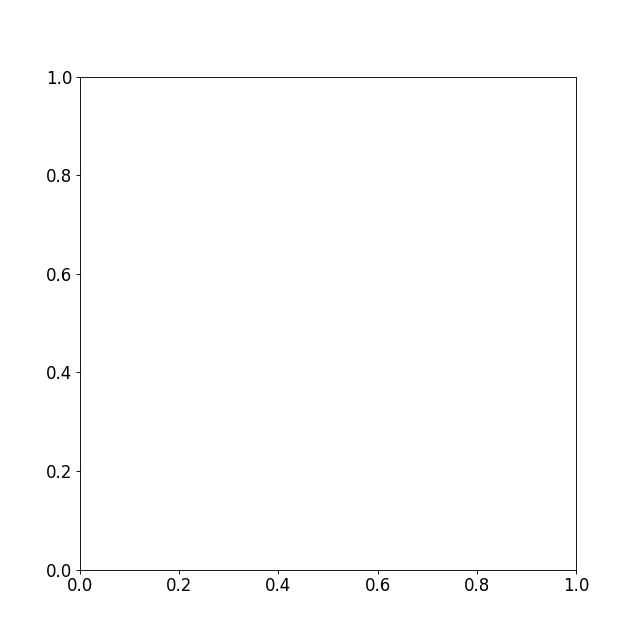

In [416]:
from utils.utils import compute_edge_index, ot_assignment

random_init_coord = False
rotate = False
plot_edges = True
dtype = torch.float64
node_count_factor = 1
model.encoder.fire_rate = 1
model.encoder.dynamic_edge_steps = 5

# model.dynamic_edge_steps = 1
# model.encoder.dynamic_edge_steps = 1

if random_init_coord or model.random_init_coord:
    # init_coord = model.encoder.init_coord(model.pool.num_nodes, dtype=dtype)
    init_coord = torch.empty(int(model.pool.num_nodes * node_count_factor), model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
else:
    init_coord = None
# init_coord = None

# init_coord = model.init_coord.clone()[:-50]

if rotate:
    (inter_coords, inter_node_feats, inter_edge_index), _, _ = model.eval(n_steps=50, rotate=True, return_inter_states=True, dtype=dtype, init_coord=init_coord)
else:
    (inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=dtype, init_coord=init_coord)

def animate(t):
    ax.clear()
    if plot_edges:
        plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), node_size=10)
    else:
        if model.structured_seed:
            coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, show_anchors=True, n_anchors=model.encoder.anchor_feat.size(0))#, feat=inter_node_feats[t])
        elif model.beacon:
            coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
        else:
            coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True)

fig = plt.figure(figsize=(8, 8), dpi=80)
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)
ani = animation.FuncAnimation(fig, animate, frames=range(len(inter_coords)), interval=250, repeat=False)

In [260]:
# ani.save(f'../result_figures/{model_name}-animation.gif', dpi=300, writer=animation.PillowWriter(fps=2))
ani.save(f'{model_name}-animation.gif', dpi=300, writer=animation.PillowWriter(fps=2))

In [235]:
box_dim = 2

In [278]:
inter_coords1_50 = inter_coords[50].clone()
inter_edge_index1_50 = inter_edge_index[50].clone()

In [132]:
import utils.visualize


reload(utils.visualize)
from utils.visualize import plot_edge_index, coord2scatter

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 1000/1000 [00:04<00:00, 238.69it/s]


$t=1000$$\quad \mathcal{L}_{\mathsf{OT}}=0.02929 + 0.000417 = 0.029707$


100%|██████████| 1000/1000 [00:03<00:00, 257.19it/s]


$t=250$$\quad \mathcal{L}_{\mathsf{OT}}=0.01741 + 0.000623 = 0.018033$


100%|██████████| 1000/1000 [00:03<00:00, 275.89it/s]


$t=150$$\quad \mathcal{L}_{\mathsf{OT}}=0.00622 + 0.000114 = 0.006334$


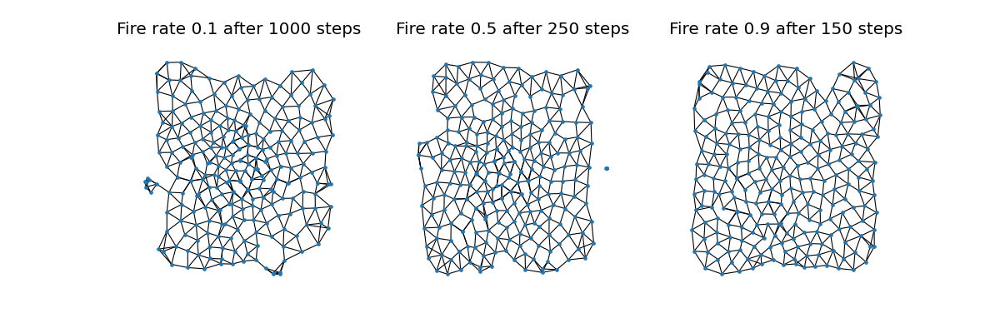

In [211]:
model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

# fire_rates = [0.1, 0.5, 0.9]
t1 = 1000
t2 = 250
t3 = 150

fig = plt.figure(figsize=(15, 5), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(131, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(132, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(133, projection='3d' if coord_dim == 3 else None)

model.encoder.fire_rate = 0.1
inter_coords1, inter_node_feats1, inter_edge_index1 = model.eval(n_steps=1000, rotate=False, return_inter_states=True, dtype=dtype, init_coord=init_coord)
print(get_title(t1, inter_coords1[t1], inter_edge_index1[t1]))
model.encoder.fire_rate = 0.5
inter_coords2, inter_node_feats2, inter_edge_index2 = model.eval(n_steps=1000, rotate=False, return_inter_states=True, dtype=dtype, init_coord=init_coord)
print(get_title(t2, inter_coords2[t2], inter_edge_index2[t2]))
model.encoder.fire_rate = 0.9
inter_coords3, inter_node_feats3, inter_edge_index3 = model.eval(n_steps=1000, rotate=False, return_inter_states=True, dtype=dtype, init_coord=init_coord)
print(get_title(t3, inter_coords3[t3], inter_edge_index3[t3]))

plot_edge_index(inter_edge_index1[t1], coord=inter_coords1[t1], ax=ax1, title=f'Fire rate 0.1 after {t1} steps', node_size=10)
plot_edge_index(inter_edge_index2[t2], coord=inter_coords2[t2], ax=ax2, title=f'Fire rate 0.5 after {t2} steps', node_size=10)
plot_edge_index(inter_edge_index3[t3], coord=inter_coords3[t3], ax=ax3, title=f'Fire rate 0.9 after {t3} steps', node_size=10)

model.encoder.fire_rate = 1

fig.savefig(f'../result_figures/grid-robust-fire_rate.png', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 100/100 [00:00<00:00, 704.24it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.15822 + 0.028457 = 0.186677$


100%|██████████| 100/100 [00:00<00:00, 396.83it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.01865 + 0.005733 = 0.024379$


100%|██████████| 100/100 [00:00<00:00, 485.43it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00705 + 0.001785 = 0.008838$


100%|██████████| 100/100 [00:00<00:00, 432.90it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00761 + 0.000371 = 0.007976$


100%|██████████| 100/100 [00:00<00:00, 288.18it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00544 + 0.000244 = 0.005683$


100%|██████████| 100/100 [00:00<00:00, 224.72it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00595 + 0.000338 = 0.006286$


100%|██████████| 100/100 [00:00<00:00, 218.82it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.01338 + 0.000914 = 0.014293$


100%|██████████| 100/100 [00:01<00:00, 66.18it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.05391 + 0.001420 = 0.055332$


100%|██████████| 100/100 [00:03<00:00, 29.68it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.10445 + 0.002507 = 0.106960$


100%|██████████| 100/100 [00:12<00:00,  8.22it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.16384 + 0.004349 = 0.168194$


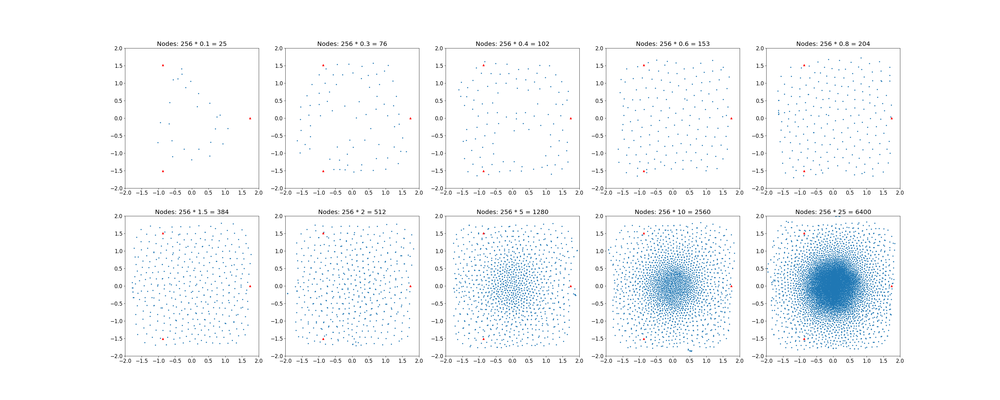

In [158]:
model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

n_steps = 100
dtype = torch.float64
node_count_factors = [0.1, 0.3, 0.4, 0.6, 0.8, 1.5, 2, 5, 10, 25]

fig = plt.figure(figsize=(40, 16), dpi=80)
fig.tight_layout()
ax1 = fig.add_subplot(251, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(252, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(253, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(254, projection='3d' if coord_dim == 3 else None)
ax5 = fig.add_subplot(255, projection='3d' if coord_dim == 3 else None)
ax6 = fig.add_subplot(256, projection='3d' if coord_dim == 3 else None)
ax7 = fig.add_subplot(257, projection='3d' if coord_dim == 3 else None)
ax8 = fig.add_subplot(258, projection='3d' if coord_dim == 3 else None)
ax9 = fig.add_subplot(259, projection='3d' if coord_dim == 3 else None)
ax10 = fig.add_subplot(2, 5, 10, projection='3d' if coord_dim == 3 else None)

axes = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10]

for node_count_factor, ax in zip(node_count_factors, axes):
    init_coord = torch.empty(int(model.pool.num_nodes * node_count_factor), model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
    coord, _, edge_index = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=init_coord)
    print(get_title(n_steps, coord, edge_index))
    
    coord2scatter(coord, box_dim=box_dim*2, ax=ax, title=f'Nodes: {model.pool.num_nodes} * {node_count_factor} = {int(model.pool.num_nodes * node_count_factor)}', zero_center=True, show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
    # plot_edge_index(edge_index, coord=coord, box_dim=box_dim*2, ax=ax, node_size=10, title=f'Nodes: {model.pool.num_nodes} * {node_count_factor} = {int(model.pool.num_nodes * node_count_factor)}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

# fig.savefig(f'../result_figures/grid-robust-node_count_factor.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 250/250 [00:00<00:00, 252.78it/s]


$t=250$$\quad \mathcal{L}_{\mathsf{OT}}=0.00917 + 0.000271 = 0.009439$


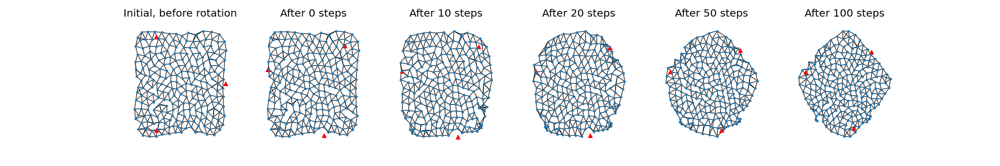

In [180]:
import numpy as np


model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

final_coord, final_node_feat, final_edge_index = model.eval(n_steps=200, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

angle = 1/8 * 2 * np.pi
n_steps = 250
show_edges = True

old_anchor_coords = model.anchor_coords.clone()
rotation = torch.tensor([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]], dtype=torch.float64, device=model.device)
rotated_beacon = torch.matmul(rotation, model.anchor_coords.T).T
model.anchor_coords = rotated_beacon
model.encoder.beacon_coords = rotated_beacon
for layer in model.encoder.egnn.layers:
    layer.beacon_coords = rotated_beacon

(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=final_coord, init_node_feat=final_node_feat)

fig = plt.figure(figsize=(24, 4), dpi=80)
fig.tight_layout()
ax1 = fig.add_subplot(161)
ax2 = fig.add_subplot(162)
ax3 = fig.add_subplot(163)
ax4 = fig.add_subplot(164)
ax5 = fig.add_subplot(165)
ax6 = fig.add_subplot(166)

steps = [0, 10, 20, 50, 100]
axes = [ax2, ax3, ax4, ax5, ax6]

if show_edges:
    plot_edge_index(final_edge_index, coord=final_coord, ax=ax1, title='Initial, before rotation', anchor_coords=old_anchor_coords, node_size=10)
    for i, t in enumerate(steps):
        plot_edge_index(inter_edge_index[t], coord=inter_coords[t], ax=axes[i], title=f'After {t} steps', anchor_coords=rotated_beacon, node_size=10)
else:
    coord2scatter(final_coord, title='Initial, before rotation', ax=ax1, zero_center=False, show_anchors=True, anchor_coords=old_anchor_coords)
    for i, t in enumerate(steps):
        coord2scatter(inter_coords[t], title=f'After {t} steps', ax=axes[i], zero_center=False, show_anchors=True, anchor_coords=rotated_beacon)

inverse_rotation = torch.tensor([[np.cos(-angle), -np.sin(-angle)], [np.sin(-angle), np.cos(-angle)]], dtype=torch.float64, device=model.device)
rotated_coords = torch.matmul(inverse_rotation, inter_coords[100].T).T
print(get_title(n_steps, rotated_coords, inter_edge_index[100]))
fig.savefig(f'../result_figures/grid-robust-rotate.pdf', dpi=300)

def animate(t):
    ax.clear()
    if show_edges:
        plot_edge_index(inter_edge_index[t], coord=inter_coords[t], ax=ax, title=f'Step {t}', anchor_coords=rotated_beacon, node_size=10)
    else:
        coord2scatter(inter_coords[t], title=f'After {t} steps', ax=ax, zero_center=False, show_anchors=True, anchor_coords=rotated_beacon)

fig = plt.figure(figsize=(8, 8), dpi=80)
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)
ani = animation.FuncAnimation(fig, animate, frames=range(100), interval=50, repeat=False)
ani.save(f'../result_figures/grid-robust-rotate-animation.gif', dpi=300, writer=animation.PillowWriter(fps=10))

# Undo rotation
model.anchor_coords = old_anchor_coords
model.encoder.beacon_coords = old_anchor_coords
for layer in model.encoder.egnn.layers:
    layer.beacon_coords = old_anchor_coords

In [161]:
get_title(1, final_coord, final_edge_index)

'$t=1$$\\quad \\mathcal{L}_{\\mathsf{OT}}=0.00255 + 0.000145 = 0.002698$'

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 500/500 [00:02<00:00, 243.72it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00400 + 0.000137 = 0.004139$


100%|██████████| 500/500 [00:02<00:00, 183.13it/s]


$t=100$$\quad \mathcal{L}_{\mathsf{OT}}=0.00632 + 0.000147 = 0.006464$


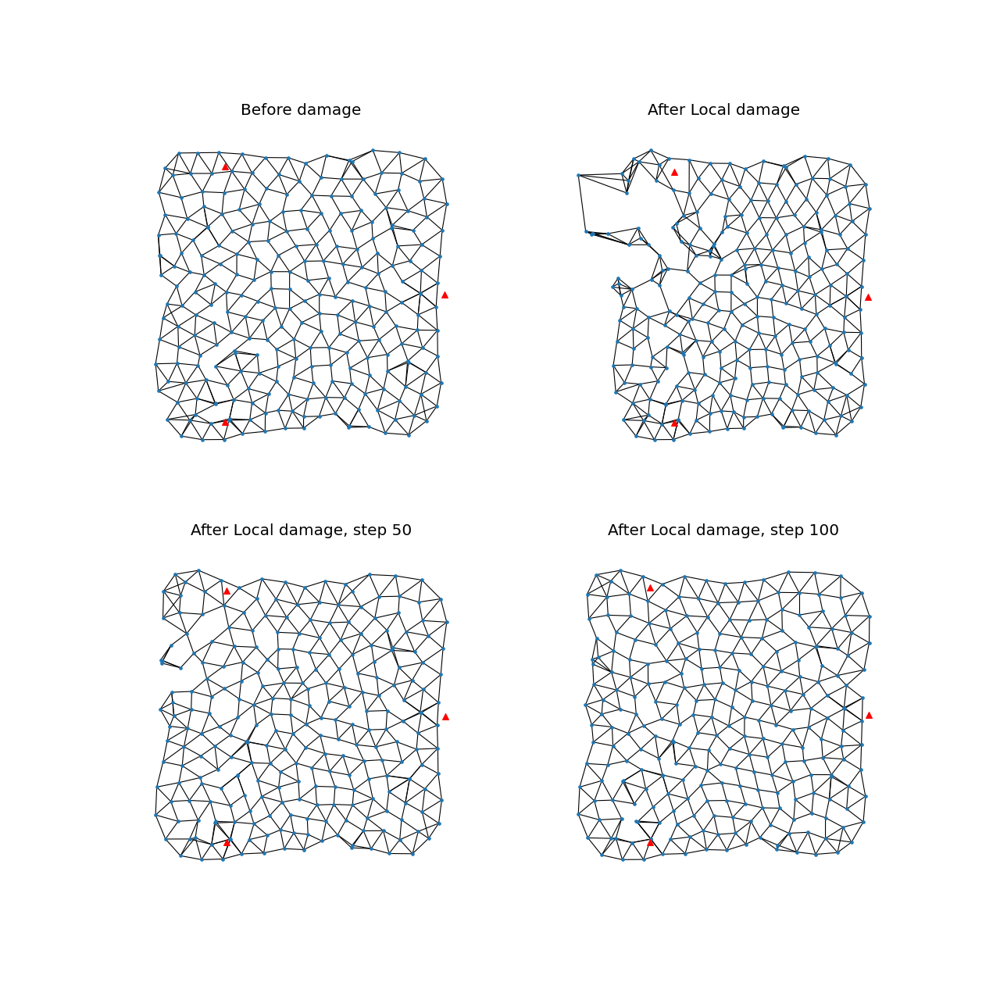

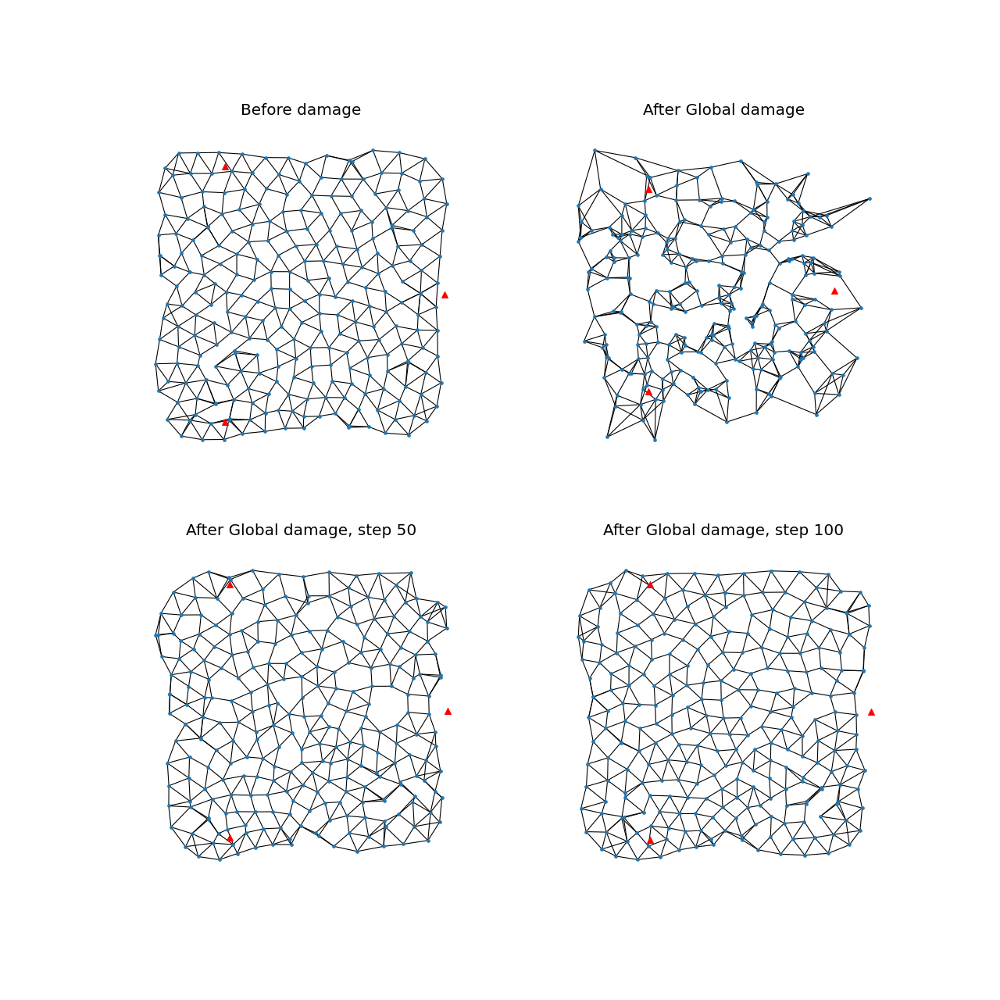

In [401]:
model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

n_steps = 500

final_coord, final_node_feats, final_edge_index = model.eval(n_steps=200, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
damaged_coord_local = damage_coord(final_coord, std=0.25, radius=1)
damaged_coord_global = damage_coord(final_coord, std=0.25)

for damaged_coord, title in zip([damaged_coord_local, damaged_coord_global], ['Local', 'Global']):
    inter_coords, inter_node_feats, inter_edge_index = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=dtype, init_coord=damaged_coord, init_node_feat=final_node_feats)

    fig = plt.figure(figsize=(16, 16), dpi=80)
    fig.tight_layout()
    ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
    ax2 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
    ax3 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
    ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

    plot_edge_index(final_edge_index, coord=final_coord, ax=ax1, title=f'Before damage', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
    plot_edge_index(inter_edge_index[0], coord=inter_coords[0], ax=ax2, title=f'After {title} damage', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
    plot_edge_index(inter_edge_index[50], coord=inter_coords[50], ax=ax3, title=f'After {title} damage, step 50', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
    plot_edge_index(inter_edge_index[100], coord=inter_coords[100], ax=ax4, title=f'After {title} damage, step 100', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

    print(get_title(100, inter_coords[100], inter_edge_index[100]))

    fig.savefig(f'../result_figures/grid-robust-damage-{title}.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 500/500 [00:04<00:00, 116.90it/s]


$t=250$$\quad \mathcal{L}_{\mathsf{OT}}=0.00486 + 0.000103 = 0.004958$


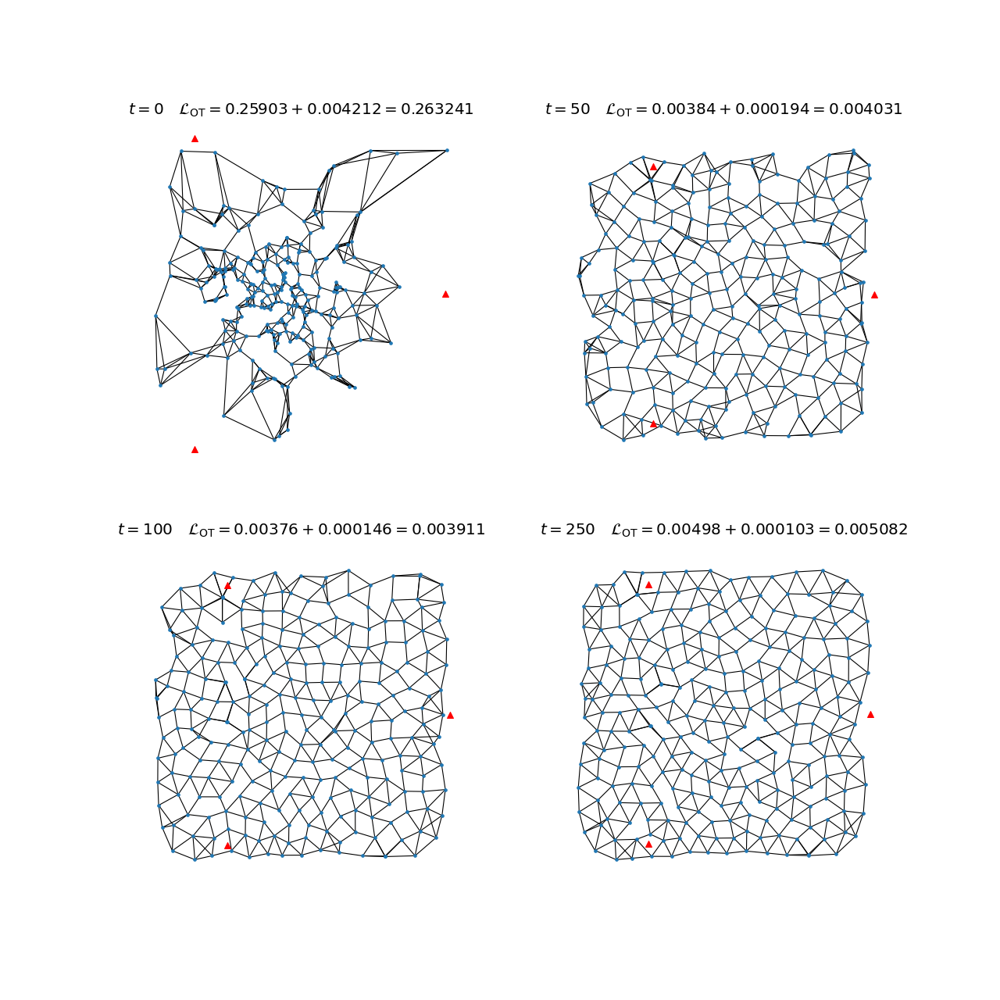

In [399]:
model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

n_steps = 500
random_init_coord = True

if random_init_coord or model.random_init_coord:
    init_coord = torch.empty(model.pool.num_nodes, model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
else:
    init_coord = None

inter_coords, inter_node_feats, inter_edge_index = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=dtype, init_coord=init_coord)

fig = plt.figure(figsize=(16, 16), dpi=80)
fig.tight_layout()
ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

plot_edge_index(inter_edge_index[0], coord=inter_coords[0], ax=ax1, title=get_title(0, inter_coords[0], inter_edge_index[0]), node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(inter_edge_index[50], coord=inter_coords[50], ax=ax2, title=get_title(50, inter_coords[50], inter_edge_index[50]), node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(inter_edge_index[100], coord=inter_coords[100], ax=ax3, title=get_title(100, inter_coords[100], inter_edge_index[100]), node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(inter_edge_index[250], coord=inter_coords[250], ax=ax4, title=get_title(250, inter_coords[250], inter_edge_index[250]), node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

print(get_title(250, inter_coords[250], inter_edge_index[250]))

fig.savefig('../result_figures/grid-robust-ric.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -apd -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=21880.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 250/250 [00:01<00:00, 192.16it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 250/250 [00:01<00:00, 164.93it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.4 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=6611.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 250/250 [00:01<00:00, 174.81it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=21964.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 250/250 [00:01<00:00, 172.15it/s]


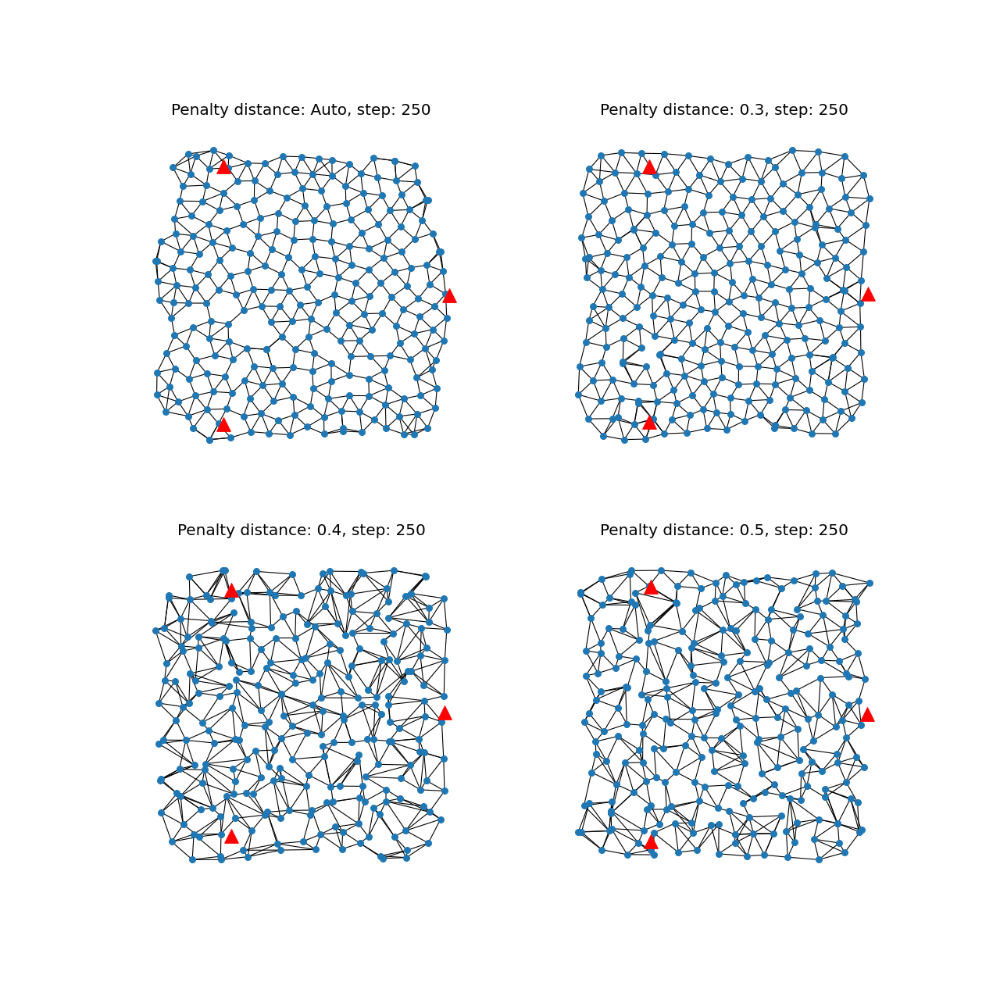

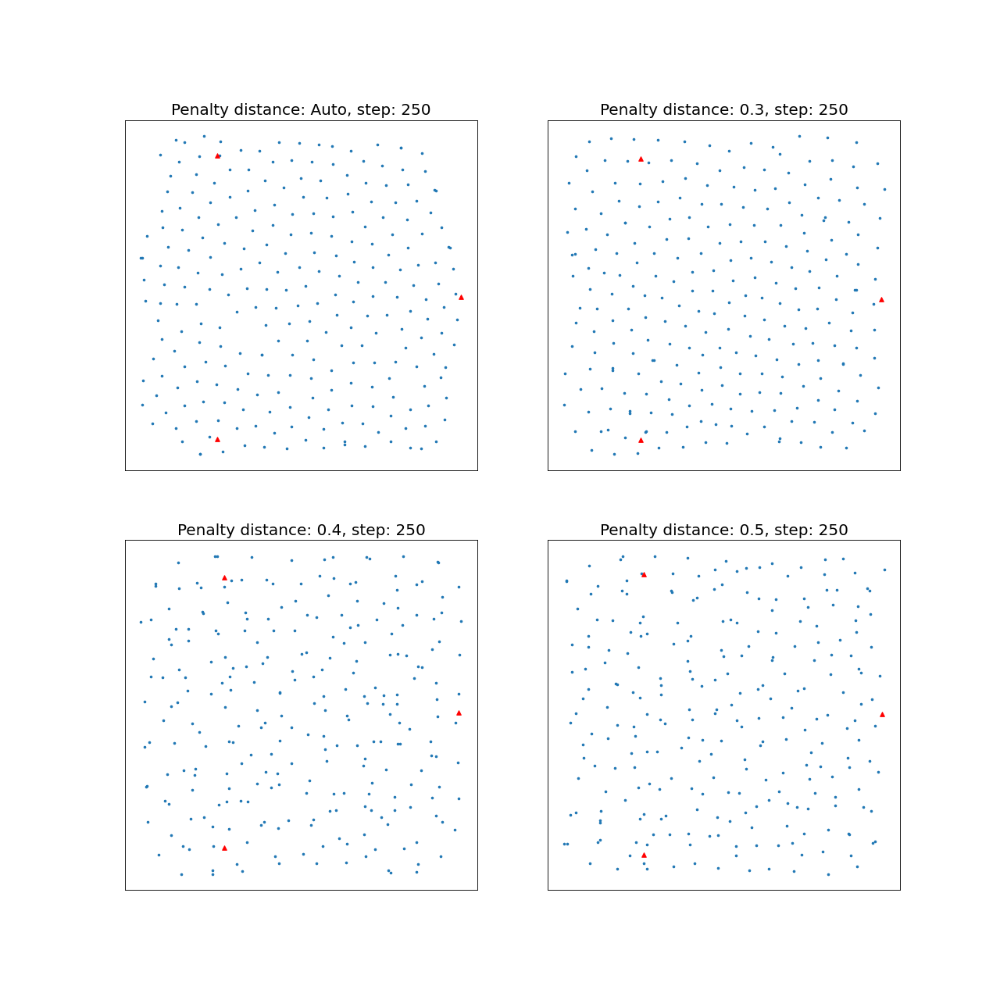

In [400]:
model1 = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -apd -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'
model2 = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'
model3 = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.4 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'
model4 = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

n_steps = 250

get_model(model1, 0)
coords1, _, edge_index1 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model2, 0)
coords2, _, edge_index2 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model3, 0)
coords3, _, edge_index3 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model4, 0)
coords4, _, edge_index4 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

fig_edges = plt.figure(figsize=(16, 16), dpi=80)
fig_edges.tight_layout()
ax1 = fig_edges.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig_edges.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig_edges.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig_edges.add_subplot(224, projection='3d' if coord_dim == 3 else None)

plot_edge_index(edge_index1, coord=coords1, ax=ax1, title=f'Penalty distance: Auto, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index2, coord=coords2, ax=ax2, title=f'Penalty distance: 0.3, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index3, coord=coords3, ax=ax3, title=f'Penalty distance: 0.4, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index4, coord=coords4, ax=ax4, title=f'Penalty distance: 0.5, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

fig_edges.savefig(f'../result_figures/grid-pers-otp-bc-pd_comp-edges-{n_steps}_steps.pdf', dpi=300)

fig = plt.figure(figsize=(16, 16), dpi=80)
fig.tight_layout()
ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xticks([])
    ax.set_yticks([])

coord2scatter(coords1, ax=ax1, title=f'Penalty distance: Auto, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords2, ax=ax2, title=f'Penalty distance: 0.3, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords3, ax=ax3, title=f'Penalty distance: 0.4, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords4, ax=ax4, title=f'Penalty distance: 0.5, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

fig.savefig(f'../result_figures/grid-pers-otp-bc-pd_comp-coords-{n_steps}_steps.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -apd -an -bc -as simplex -re -de -en 4 -des 5 --seed 42/version_0/checkpoints/best_model-step=3121.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.7 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.7 K     Trainable params
0         Non-trainable params
8.7 K     Total params
0.035     Total estimated model params size (MB)


100%|██████████| 25/25 [00:01<00:00, 15.17it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=10669.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 25/25 [00:00<00:00, 145.35it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -pd 0.4 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=2068.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 25/25 [00:00<00:00, 160.26it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=1815.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 25/25 [00:00<00:00, 165.56it/s]


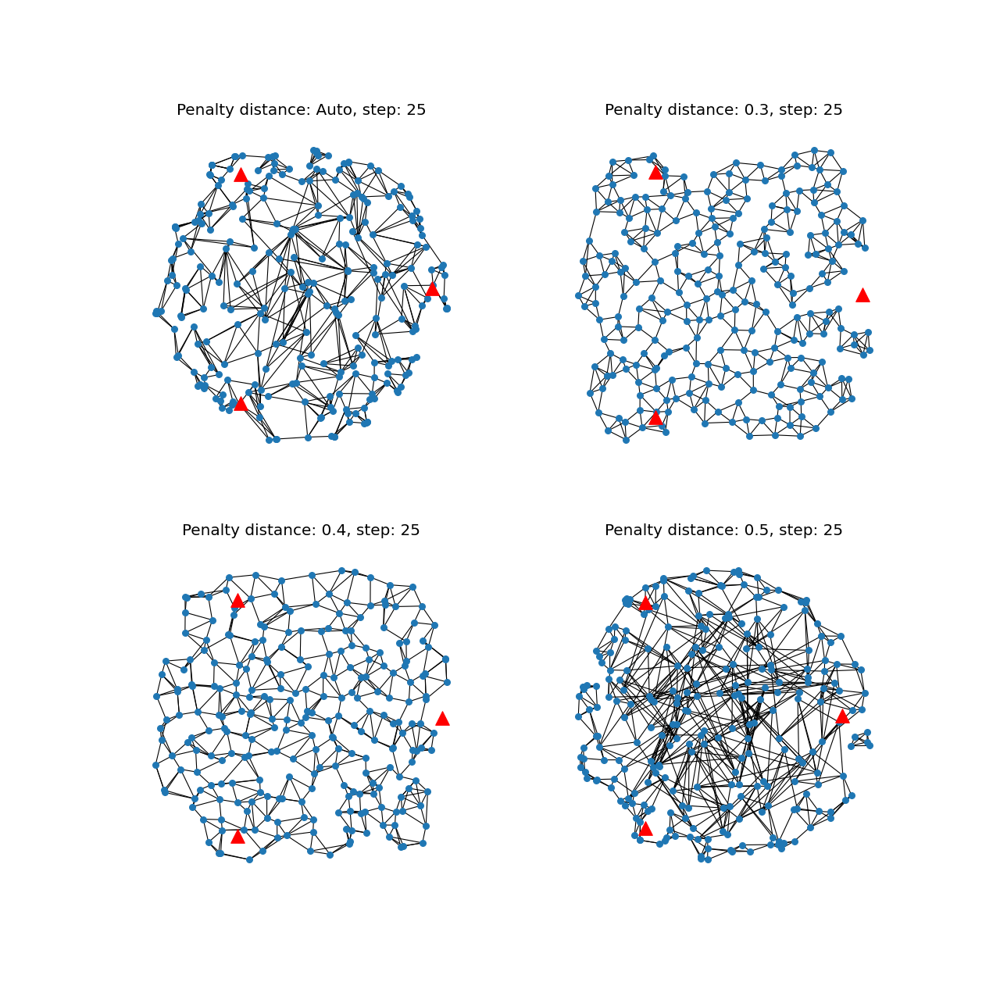

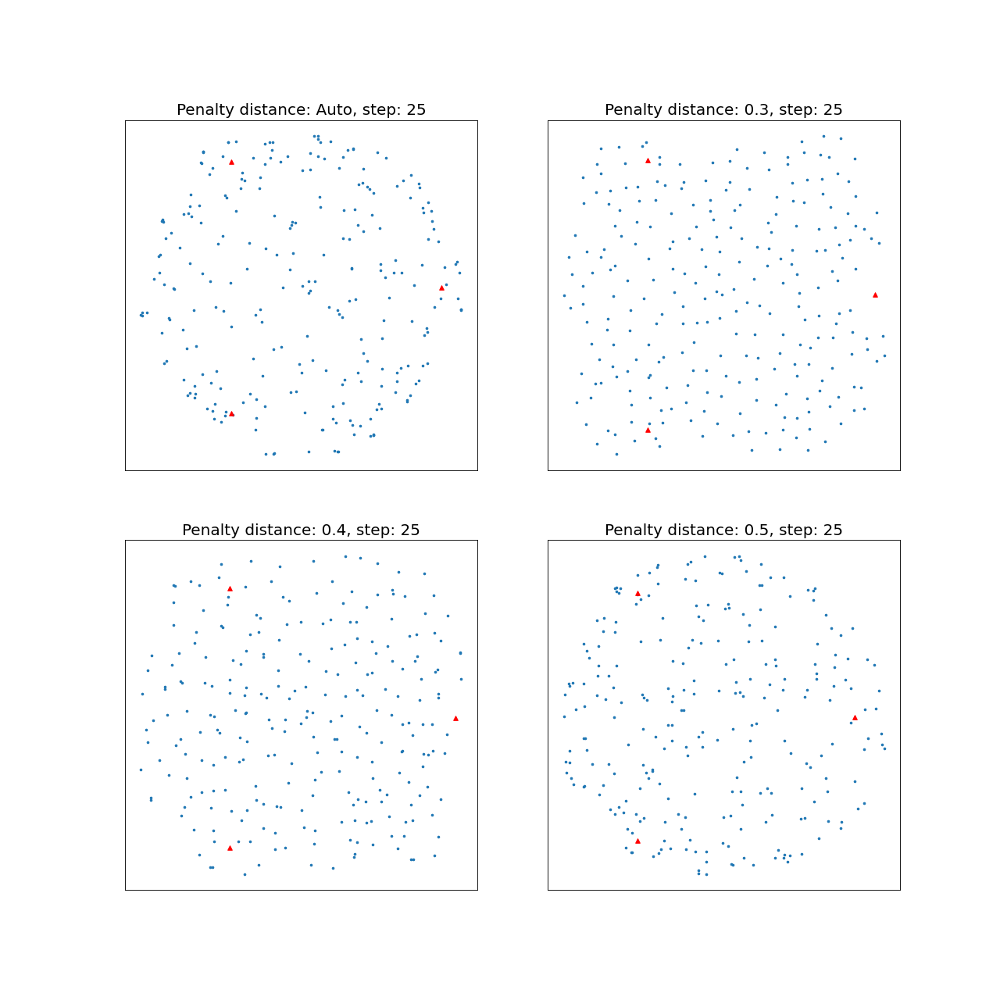

In [396]:
model1 = '-ds Grid2d -bsc 0 1 -l ot_p -apd -an -bc -as simplex -re -de -en 4 -des 5 --seed 42'
model2 = '-ds Grid2d -bsc 0 1 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'
model3 = '-ds Grid2d -bsc 0 1 -l ot_p -pd 0.4 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'
model4 = '-ds Grid2d -bsc 0 1 -l ot_p -pd 0.5 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

n_steps = 25

get_model(model1, 0)
coords1, _, edge_index1 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model2, 0)
coords2, _, edge_index2 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model3, 0)
coords3, _, edge_index3 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

get_model(model4, 0)
coords4, _, edge_index4 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

fig_edges = plt.figure(figsize=(16, 16), dpi=80)
fig_edges.tight_layout()
ax1 = fig_edges.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig_edges.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig_edges.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig_edges.add_subplot(224, projection='3d' if coord_dim == 3 else None)

plot_edge_index(edge_index1, coord=coords1, ax=ax1, title=f'Penalty distance: Auto, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index2, coord=coords2, ax=ax2, title=f'Penalty distance: 0.3, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index3, coord=coords3, ax=ax3, title=f'Penalty distance: 0.4, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(edge_index4, coord=coords4, ax=ax4, title=f'Penalty distance: 0.5, step: {n_steps}', anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

fig_edges.savefig(f'../result_figures/grid-otp-bc-pd_comp-edges.pdf', dpi=300)

fig = plt.figure(figsize=(16, 16), dpi=80)
fig.tight_layout()
ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

for ax in [ax1, ax2, ax3, ax4]:
    ax.set_xticks([])
    ax.set_yticks([])

coord2scatter(coords1, ax=ax1, title=f'Penalty distance: Auto, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords2, ax=ax2, title=f'Penalty distance: 0.3, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords3, ax=ax3, title=f'Penalty distance: 0.4, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(coords4, ax=ax4, title=f'Penalty distance: 0.5, step: {n_steps}', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

fig.savefig(f'../result_figures/grid-otp-bc-pd_comp-coords.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -an -ss -as corners -re -de -en 4 -des 5 -ad 0.3 --seed 42/version_0/checkpoints/best_model-step=1585.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


  0%|          | 0/50 [00:00<?, ?it/s]d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:207: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_coord[anchor_mask] = in_coord[anchor_mask]
d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:209: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_node_feat[anchor_mask] = in_node_feat[anchor_mask]
100%|██████████| 50/50 [00:04<00:00, 12.05it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -ss -as simplex -re -de -en 4 -des 5 -ad 0.3 --seed 42/version_0/checkpoints/best_model-step=2637.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 50/50 [00:00<00:00, 129.20it/s]


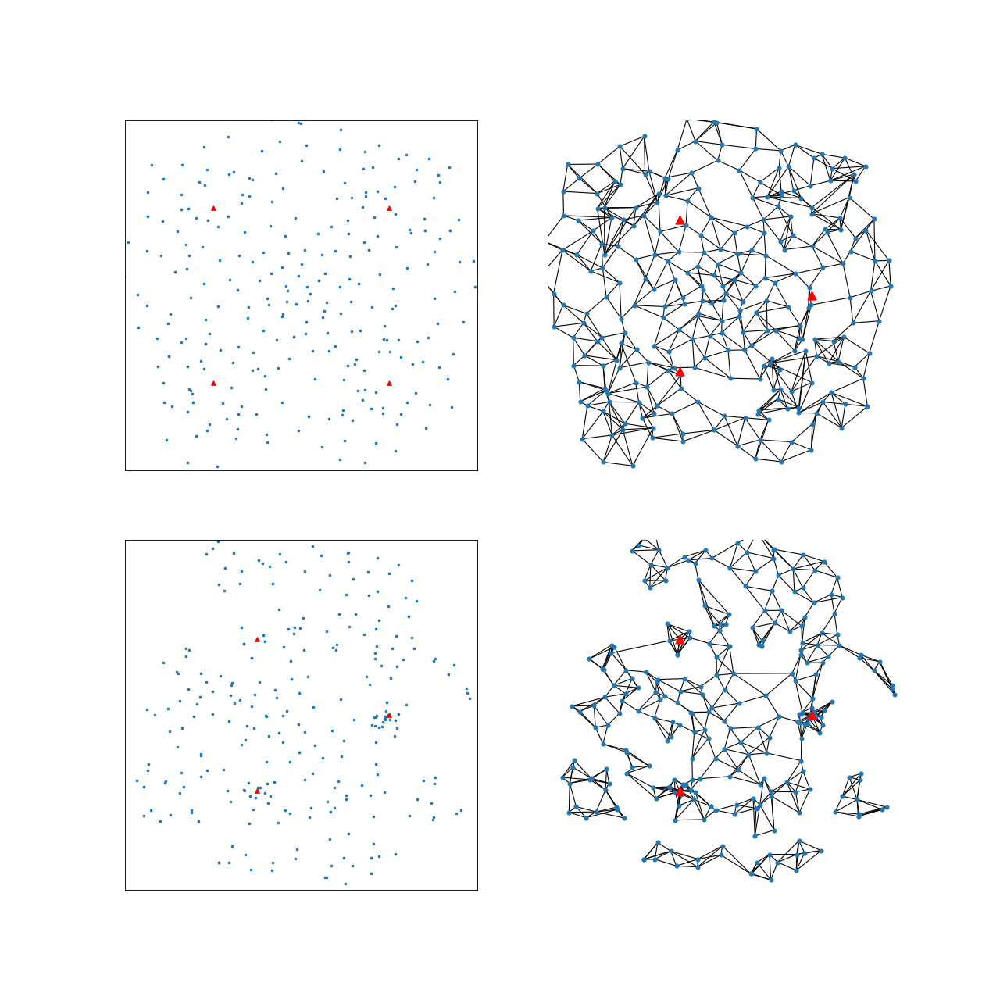

In [392]:
# Model1: -ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -an -ss -as corners -re -de -en 4 -des 5 -ad 0.3 --seed 42
# Model:  -ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -ss -as simplex -re -de -en 4 -des 5 -ad 0.3 --seed 42

get_model("-ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -an -ss -as corners -re -de -en 4 -des 5 -ad 0.3 --seed 42", 0)
(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None)

inter_coords1_50 = inter_coords[50].clone()
inter_edge_index1_50 = inter_edge_index[50].clone()

get_model("-ds Grid2d -bsc 0 8 2000 16 -l ot_p -pd 0.3 -ss -as simplex -re -de -en 4 -des 5 -ad 0.3 --seed 42", 0)
(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None)

fig_grid_otp_ss_dyn = plt.figure(figsize=(16, 16), dpi=80)
fig_grid_otp_ss_dyn.tight_layout()
ax1 = fig_grid_otp_ss_dyn.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig_grid_otp_ss_dyn.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig_grid_otp_ss_dyn.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig_grid_otp_ss_dyn.add_subplot(224, projection='3d' if coord_dim == 3 else None)

coord2scatter(inter_coords1_50, box_dim=box_dim*2, zero_center=True, ax=ax1, show_anchors=True, n_anchors=4)
plot_edge_index(inter_edge_index1_50, coord=inter_coords1_50, box_dim=box_dim*2, ax=ax2, node_size=20, anchor_coords=model.anchor_coords)
coord2scatter(inter_coords[33], box_dim=box_dim*2, zero_center=True, ax=ax3, show_anchors=True, n_anchors=3)
plot_edge_index(inter_edge_index[33], coord=inter_coords[33], box_dim=box_dim*2, ax=ax4, node_size=20, anchor_coords=model.anchor_coords)

# Remove axis labels
ax1.set_xticks([])
ax1.set_yticks([])
ax3.set_xticks([])
ax3.set_yticks([])

fig_grid_otp_ss_dyn.savefig('grid otp ss simplex dyn.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot -at undirected -an -ffa -ss -as corners -asc 1.5 -uaf -re -de -des 5 -en 5 --seed 123 (3)/version_0/checkpoints/best_model-step=13090.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.8 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.8 K     Trainable params
0         Non-trainable params
8.8 K     Total params
0.035     Total estimated model params size (MB)


  0%|          | 0/50 [00:00<?, ?it/s]d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:207: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_coord[anchor_mask] = in_coord[anchor_mask]
100%|██████████| 50/50 [00:03<00:00, 14.76it/s]


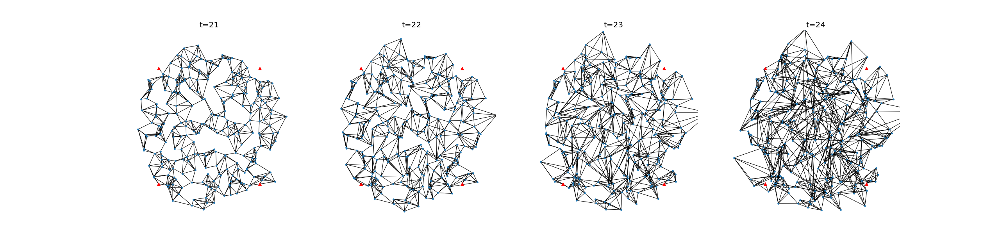

In [393]:
# Model: -ds Grid2d -bsc 0 1 -l ot -at undirected -an -ffa -ss -as corners -asc 1.5 -uaf -re -de -des 5 -en 5 --seed 123 (3)

get_model("-ds Grid2d -bsc 0 1 -l ot -at undirected -an -ffa -ss -as corners -asc 1.5 -uaf -re -de -des 5 -en 5 --seed 123 (3)", 0)
(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None)

fig_grid_ot_divergent = plt.figure(figsize=(32, 8), dpi=80)
fig_grid_ot_divergent.tight_layout()

ax1 = fig_grid_ot_divergent.add_subplot(141, projection='3d' if coord_dim == 3 else None)
ax2 = fig_grid_ot_divergent.add_subplot(142, projection='3d' if coord_dim == 3 else None)
ax3 = fig_grid_ot_divergent.add_subplot(143, projection='3d' if coord_dim == 3 else None)
ax4 = fig_grid_ot_divergent.add_subplot(144, projection='3d' if coord_dim == 3 else None)

# Plot steps 21, 22, 23, 24
plot_edge_index(inter_edge_index[21], coord=inter_coords[21], box_dim=box_dim*2.5, ax=ax1, title='t=21', node_size=10, anchor_coords=model.anchor_coords)
plot_edge_index(inter_edge_index[22], coord=inter_coords[22], box_dim=box_dim*2.5, ax=ax2, title='t=22', node_size=10, anchor_coords=model.anchor_coords)
plot_edge_index(inter_edge_index[23], coord=inter_coords[23], box_dim=box_dim*2.5, ax=ax3, title='t=23', node_size=10, anchor_coords=model.anchor_coords)
plot_edge_index(inter_edge_index[24], coord=inter_coords[24], box_dim=box_dim*2.5, ax=ax4, title='t=24', node_size=10, anchor_coords=model.anchor_coords)

fig_grid_ot_divergent.savefig('../../gifs and pictures/grid_ot_divergent.pdf', dpi=300)

In [384]:
reload(utils.visualize)

from utils.visualize import plot_edge_index, coord2scatter

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex -re -en 4 --seed 42 -nt nn/version_0/checkpoints/best_model-step=26521.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 50/50 [00:00<00:00, 284.10it/s]


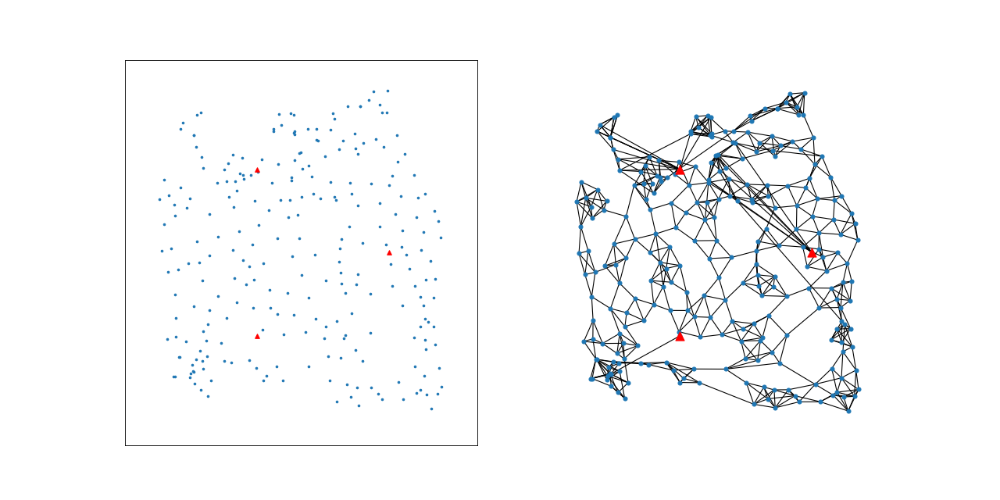

In [385]:
# Model: -ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex -re -en 4 --seed 42 -nt nn
# Requires encoder.anchor_coords

get_model("-ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex -re -en 4 --seed 42 -nt nn", 0)
(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None)

fig_grid_otp_ss_re = plt.figure(figsize=(16, 8), dpi=80)
fig_grid_otp_ss_re.tight_layout()
ax1 = fig_grid_otp_ss_re.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig_grid_otp_ss_re.add_subplot(122, projection='3d' if coord_dim == 3 else None)

coord2scatter(inter_coords[25], box_dim=box_dim*2, zero_center=True, ax=ax1, show_anchors=True, n_anchors=3)
plot_edge_index(inter_edge_index[25], coord=inter_coords[25], box_dim=box_dim*2, ax=ax2, node_size=20, anchor_coords=model.anchor_coords)

ax1.set_xticks([])
ax1.set_yticks([])

fig_grid_otp_ss_re.savefig('grid otp ss simplex re nodenorm.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex --seed 42 -nt nn/version_0/checkpoints/best_model-step=34882.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 50/50 [00:00<00:00, 251.27it/s]


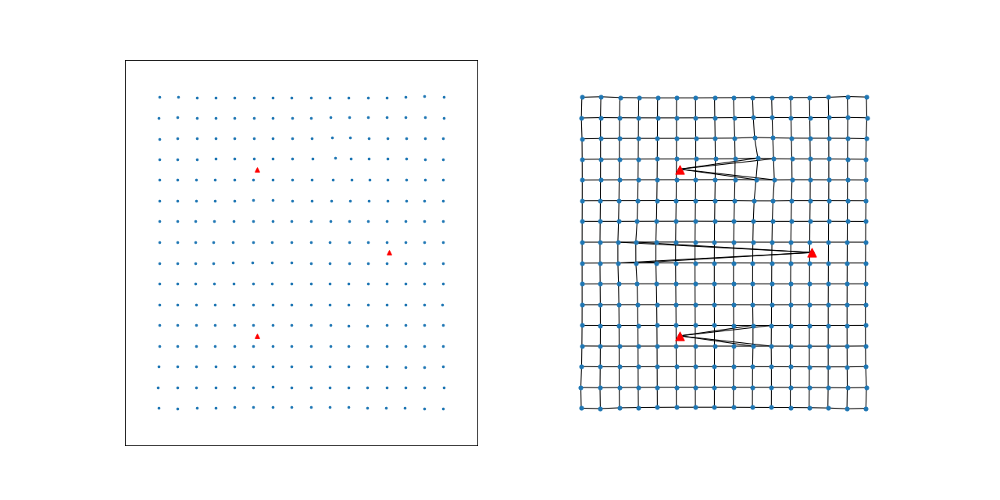

In [386]:
# Model: -ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex --seed 42 -nt nn (normalize=False in EGC)

get_model("-ds Grid2d -bsc 0 1 -l ot_p -ss -as simplex --seed 42 -nt nn", 0)
for layer in model.encoder.egnn.layers:
    layer.normalize = False
(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=50, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None)

fig_grid_otp_ss = plt.figure(figsize=(16, 8), dpi=80)
fig_grid_otp_ss.tight_layout()
ax1 = fig_grid_otp_ss.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig_grid_otp_ss.add_subplot(122, projection='3d' if coord_dim == 3 else None)

coord2scatter(inter_coords[50], box_dim=box_dim*2, zero_center=True, ax=ax1, show_anchors=True, n_anchors=3)
plot_edge_index(inter_edge_index[50], coord=inter_coords[50], box_dim=box_dim*2, ax=ax2, node_size=20, anchor_coords=model.anchor_coords)

ax1.set_xticks([])
ax1.set_yticks([])

fig_grid_otp_ss.savefig('grid otp ss simplex nodenorm.pdf', dpi=300)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42/version_0/checkpoints/best_model-step=26537.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


  0%|          | 0/50 [00:00<?, ?it/s]d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:207: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_coord[anchor_mask] = in_coord[anchor_mask]
d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:209: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_node_feat[anchor_mask] = in_node_feat[anchor_mask]
 36%|███▌      | 18/50 [00:00<00:00, 176.47it/s]

100%|██████████| 50/50 [00:00<00:00, 128.87it/s]


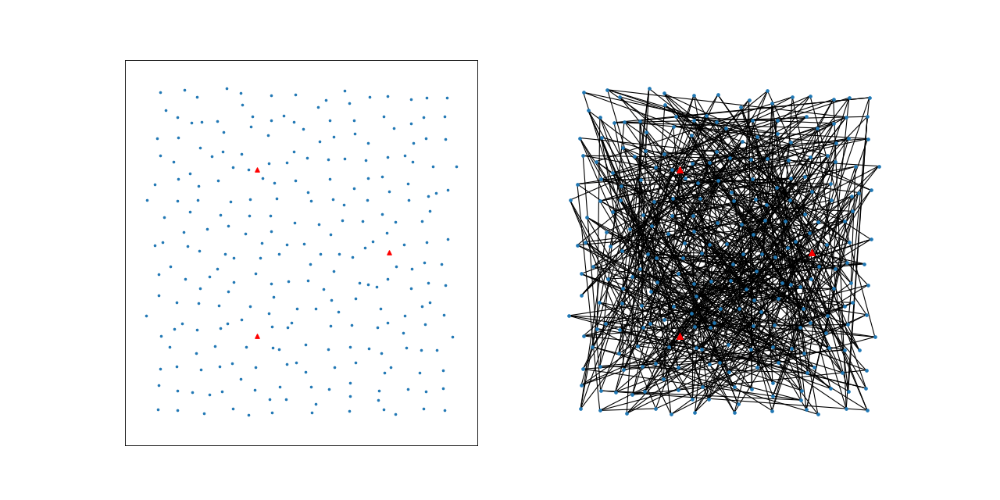

In [388]:
model_name = '-ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42'
# model_name = '-ds Grid2d -bsc 0 1 -l ot -ss -as simplex --seed 42 -nt nn'

get_model(model_name, 0)

n_steps = 50

inter_coords, inter_node_feats, inter_edge_index = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=dtype, init_coord=None)

t = 23
fig_t23 = plt.figure(figsize=(16, 8), dpi=80)
ax1 = fig_t23.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig_t23.add_subplot(122, projection='3d' if coord_dim == 3 else None)

ax1.set_xticks([])
ax1.set_yticks([])

coord2scatter(inter_coords[t], box_dim=box_dim*2, zero_center=True, ax=ax1, show_anchors=True, n_anchors=3)#, feat=inter_node_feats[t])
# plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*0.6, title=get_title(t, inter_coords[t], inter_edge_index[t]), ax=ax_t50_edges, node_size=10)
plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*2, ax=ax2, node_size=10, anchor_coords=model.anchor_coords)

# fig_t50.savefig(f'../result_figures/bare_ot-t23.png', dpi=300)
# fig_t50_edges.savefig(f'../result_figures/bare_ot-t23_edges.png', dpi=300)
fig_t23.savefig(f'../result_figures/bare_ot-t23.pdf', dpi=300)

In [32]:
model.penalty_distance, model.penalty_distance_min

(0.21693050861358643, 0.21693038940429688)

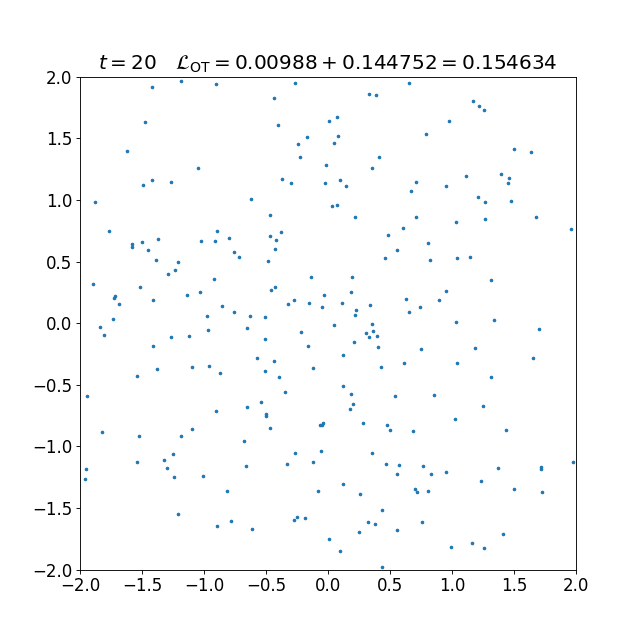

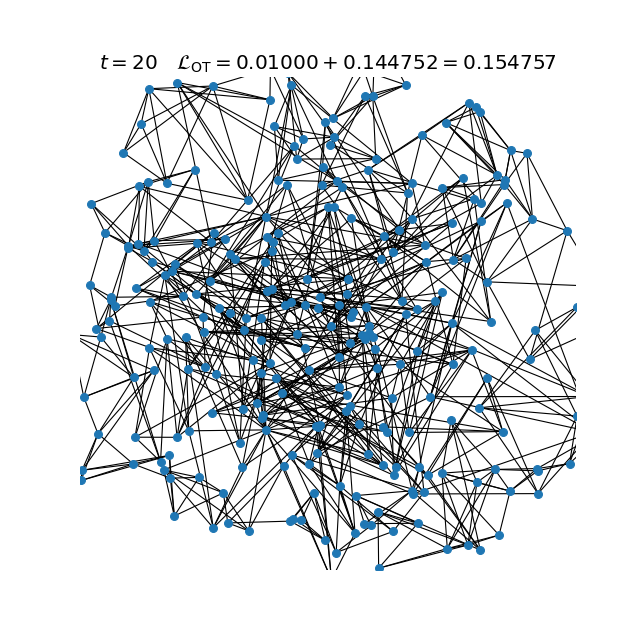

In [11]:
t = 20
fig_t25 = plt.figure(figsize=(8, 8), dpi=80)
ax_t25 = fig_t25.add_subplot(projection='3d' if coord_dim == 3 else None)
fig_t25_edges = plt.figure(figsize=(8, 8), dpi=80)
ax_t25_edges = fig_t25_edges.add_subplot(projection='3d' if coord_dim == 3 else None)
coord2scatter(inter_coords[t], box_dim=box_dim*2, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, ax=ax_t25)#, feat=inter_node_feats[t])
plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*2, title=get_title(t, inter_coords[t], inter_edge_index[t]), ax=ax_t25_edges)

# fig_t25.savefig(f'../result_figures/ot_p-beacon-t50.png', dpi=300)
# fig_t25_edges.savefig(f'../result_figures/ot_p-beacon-t50_edges.png', dpi=300)

0.28674189547955536 0.18596843280883954
0.035912772907417845 0.06270717721520569


Text(0, 0.5, 'distance smoothness')

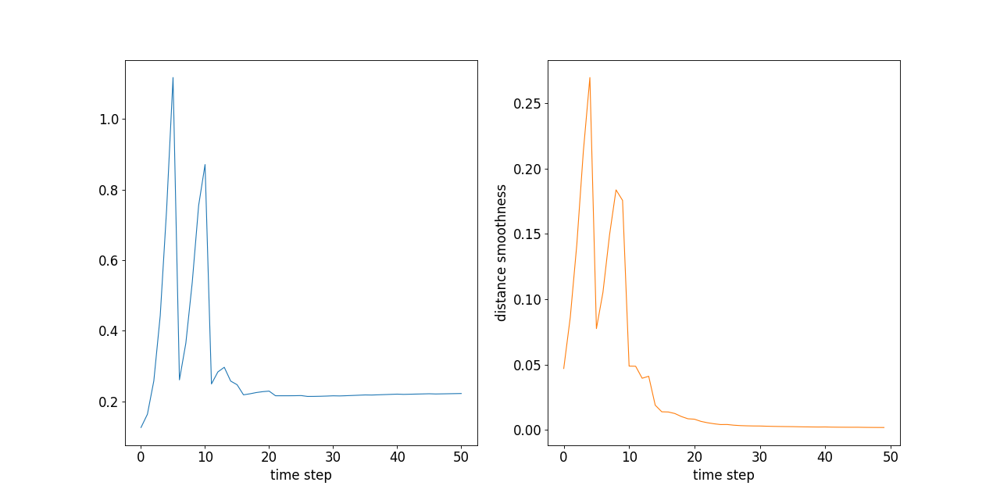

In [400]:
reload(utils.utils)
from utils.utils import smoothness, distance_smoothness


# smoothnesses, s_mean, s_std = smoothness(inter_coords, edge_index)
smoothnesses, s_mean, s_std = smoothness(inter_coords, inter_edge_index)
dist_smoothnesses, d_mean, d_std = distance_smoothness(inter_coords)

print(s_mean, s_std)
print(d_mean, d_std)

# Plot smoothness with line plot without showing all x ticks
fig_smoothness = plt.figure(figsize=(16, 8), dpi=80)
fig_smoothness.tight_layout()
ax_smoothness = fig_smoothness.add_subplot(121)
# plot_trend(range(len(smoothnesses)), smoothnesses, x_label='time step', y_label='smoothness', ax=ax)
# ax.set_xticks(range(0, len(smoothnesses), 10))
# Dont draw points, just the line
ax_smoothness.plot(range(len(smoothnesses)), smoothnesses, color='tab:blue', linewidth=1)
ax_smoothness.xaxis.set_label_text('time step')

# Plot distance smoothness with line plot without showing all x ticks
ax_dist_smoothness = fig_smoothness.add_subplot(122)
ax_dist_smoothness.plot(range(len(dist_smoothnesses)), dist_smoothnesses, color='tab:orange', linewidth=1)
ax_dist_smoothness.xaxis.set_label_text('time step')
ax_dist_smoothness.yaxis.set_label_text('distance smoothness')

# fig_smoothness.savefig(f'../result_figures/{model_name}-smoothness.png', dpi=300)

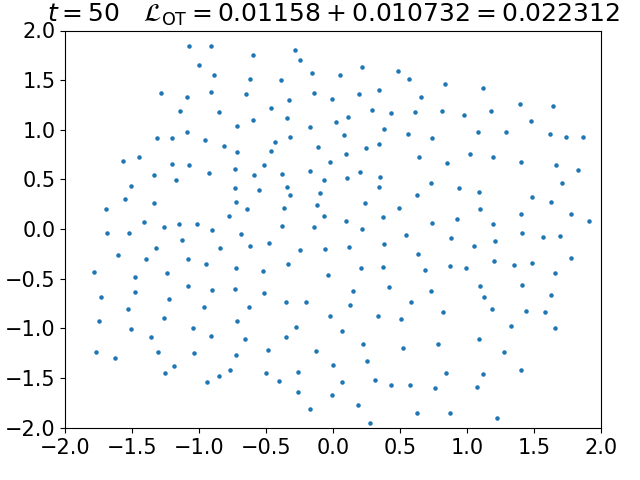

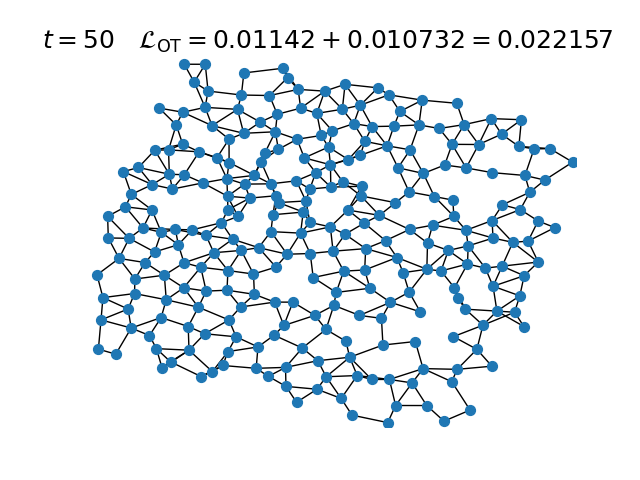

In [16]:
t = 50
coord2scatter(inter_coords[t], box_dim=box_dim*2, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True)
edge_index = compute_edge_index(None, inter_coords[t], torch.LongTensor([inter_coords[t].size(0)]), True, False, distance=0.3, n_neighbours=4, min_neighbours=2)
plot_edge_index(edge_index, coord=inter_coords[t], box_dim=box_dim*2, title=get_title(t, inter_coords[t], inter_edge_index[t]))

100%|██████████| 100/100 [00:00<00:00, 203.66it/s]


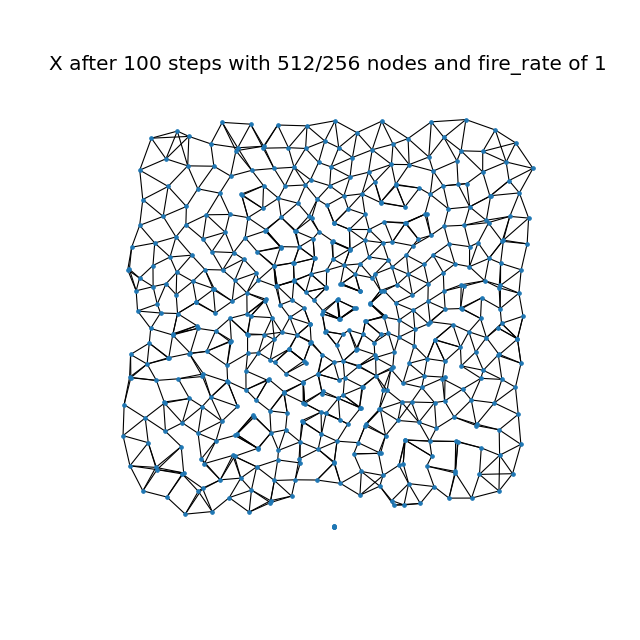

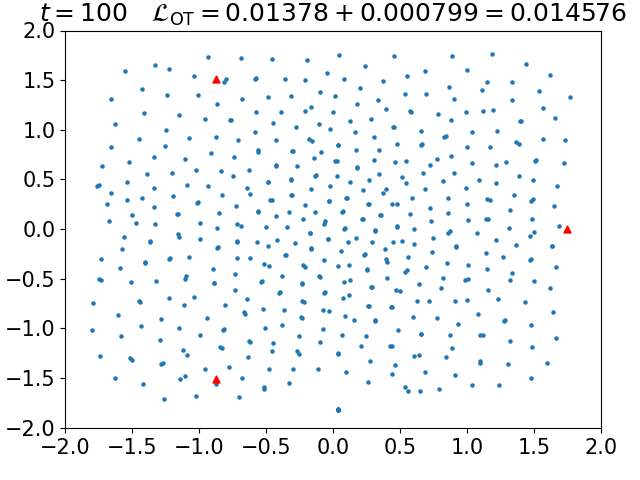

In [152]:
figje = plt.figure(figsize=(8, 8), dpi=80)
axje = figje.add_subplot(111, projection='3d' if coord_dim == 3 else None)
# axje_target = figje.add_subplot(122, projection='3d' if coord_dim == 3 else None)

model.encoder.fire_rate = 1
model.encoder.dynamic_edge_steps = 5
random_init_coord = True
node_count_factor = 2
n_steps = 100


if random_init_coord or model.random_init_coord:
    # init_coord = model.encoder.init_coord(model.pool.num_nodes, dtype=dtype)
    init_coord = torch.empty(int(model.pool.num_nodes * node_count_factor), model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
else:
    init_coord = None

final_coord, final_node_feat, final_edge_index = model.eval(n_steps=n_steps, rotate=False, dtype=torch.float64, init_coord=init_coord)
fig = coord2scatter(final_coord, title=get_title(n_steps, final_coord, final_edge_index), box_dim=box_dim*2, zero_center=True, show_anchors=True, anchor_coords=model.anchor_coords)
# plot_edge_index(final_edge_index, coord=final_coord.detach().cpu().numpy(), title=get_title(n_steps, final_coord, final_edge_index), node_size=10)
n_init_coord = init_coord.shape[0] if init_coord is not None else model.pool.num_nodes
plot_edge_index(final_edge_index, coord=final_coord.detach().cpu().numpy(), ax=axje, title=f"X after {n_steps} steps with {n_init_coord}/{model.pool.num_nodes} nodes and fire_rate of {model.encoder.fire_rate}", node_size=10)
# plot_edge_index(model.edge_index, coord=model.target_coord, ax=axje_target, title='Target', node_size=10)
# figje.savefig('X with more nodes and low firerate', dpi=300)

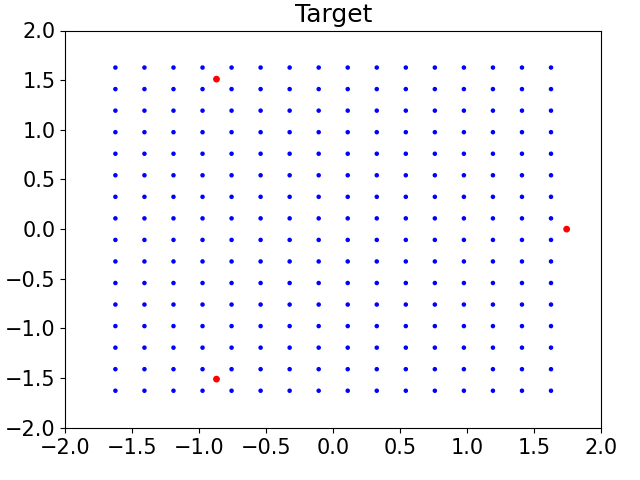

In [427]:
coord2scatter(model.target_coord, title='Target', box_dim=box_dim*2, zero_center=True, show_anchors=True, anchor_coords=model.anchor_coords)

In [412]:
final_coord[final_coord[:, 0] > 1.9]

tensor([[ 2.0165, -0.6149],
        [ 2.0165, -0.6149],
        [ 2.0165, -0.6149],
        [ 2.0165, -0.6149],
        [ 2.0165, -0.6149]], device='cuda:0', dtype=torch.float64)

In [244]:
tqdm

tqdm.auto.tqdm

In [245]:
from time import sleep
from tqdm.notebook import tqdm

for i in tqdm(range(1000)):
    sleep(0.1)

Exception ignored in: <function tqdm.__del__ at 0x0000015A051FE3A0>
Traceback (most recent call last):
  File "d:\Anaconda3\envs\egnca-main\lib\site-packages\tqdm\std.py", line 1149, in __del__
  File "d:\Anaconda3\envs\egnca-main\lib\site-packages\tqdm\notebook.py", line 299, in close
AttributeError: 'tqdm' object has no attribute 'disp'
Exception ignored in: <function tqdm.__del__ at 0x0000015A051FE3A0>
Traceback (most recent call last):
  File "d:\Anaconda3\envs\egnca-main\lib\site-packages\tqdm\std.py", line 1149, in __del__
  File "d:\Anaconda3\envs\egnca-main\lib\site-packages\tqdm\notebook.py", line 296, in close
AttributeError: 'tqdm' object has no attribute 'disp'


AttributeError: 'NoneType' object has no attribute 'children'

# Moving beacons

In [219]:
load_model(116, base_path='../log/test', sort='a')

Loading model: version_116
../log/test/version_116/checkpoints/best_model-step=12550.ckpt
[0.93333334 1.        ] [-0.93333334 -1.        ]
[0.93333334 1.        ]
tensor([0.1333, 0.1333, 0.1333, 0.1333])
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.8 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.8 K     Trainable params
0         Non-trainable params
8.8 K     Total params
0.035     Total estimated model params size (MB)


In [255]:
model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn'

get_model(model_name, 0)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l ot_p -pd 0.3 -bc -as simplex -re -de -en 4 -des 5 --seed 42 -nt nn/version_0/checkpoints/best_model-step=5195.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.4 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.4 K     Trainable params
0         Non-trainable params
5.4 K     Total params
0.022     Total estimated model params size (MB)


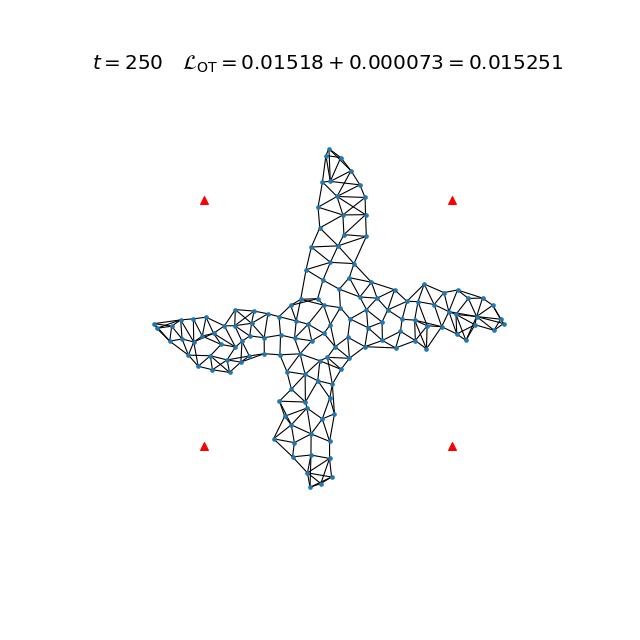

In [230]:
import numpy as np

angle = 1/8 * 2 * np.pi
n_steps = 250
show_edges = True

old_anchor_coords = model.anchor_coords.clone()
rotation = torch.tensor([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]], dtype=torch.float64, device=model.device)
inverse_rotation = torch.tensor([[np.cos(-angle), -np.sin(-angle)], [np.sin(-angle), np.cos(-angle)]], dtype=torch.float64, device=model.device)
rotated_beacon = torch.matmul(rotation, model.anchor_coords.T).T
model.anchor_coords = rotated_beacon
model.encoder.beacon_coords = rotated_beacon
for layer in model.encoder.egnn.layers:
    layer.beacon_coords = rotated_beacon

# (inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=final_coord, init_node_feat=final_node_feat)

def animate(t):
    t = t
    ax.clear()
    if show_edges:
        rotated_inter_coord = torch.matmul(inverse_rotation, inter_coords[t].T).T
        plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, rotated_inter_coord, inter_edge_index[t]), node_size=10, anchor_coords=rotated_beacon)
    else:
        coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, show_anchors=True, anchor_coords=rotated_beacon)

fig = plt.figure(figsize=(8, 8), dpi=80)
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)
ani = animation.FuncAnimation(fig, animate, frames=range(len(inter_coords)), interval=100, repeat=False)

ani.save(f'../result_figures/x-robust-rotate-animation.gif', dpi=300, writer=animation.PillowWriter(fps=10))

# Undo rotation
model.anchor_coords = old_anchor_coords
model.encoder.beacon_coords = old_anchor_coords
for layer in model.encoder.egnn.layers:
    layer.beacon_coords = old_anchor_coords

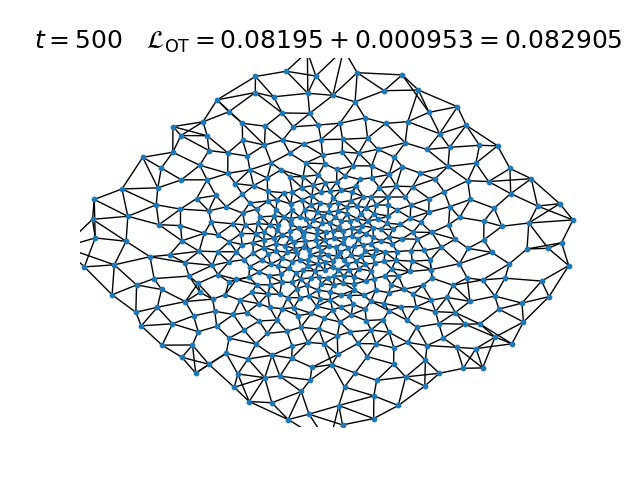

In [334]:
new_edge_index = compute_edge_index(model.edge_index, inter_coords[-1], torch.LongTensor([inter_coords[-1].size(0)]), True, False, distance=None, n_neighbours=4, min_neighbours=None)
plot_edge_index(new_edge_index, coord=inter_coords[-1], box_dim=box_dim*2, title=get_title(n_steps, inter_coords[-1], new_edge_index), node_size=10)

# regeneration

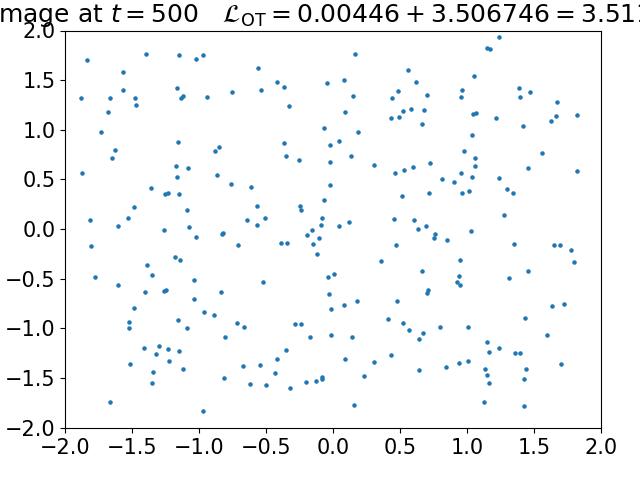

In [385]:
# damaged_coord = damage_coord(final_coord, std=0.25, radius=1.0)
damaged_coord = damage_coord(final_coord, std=0.25)
# damaged_coord = damage_coord(inter_coords[-1], std=0.25, radius=1.0)#, n_anchors=model.encoder.anchor_feat.size(0))
# damaged_coord = damage_coord(inter_coords[-1], std=0.25)#, n_anchors=model.encoder.anchor_feat.size(0))
coord2scatter(damaged_coord, box_dim=box_dim*2, title='damage at ' + get_title(n_steps, damaged_coord))

100%|██████████| 50/50 [00:00<00:00, 113.90it/s]


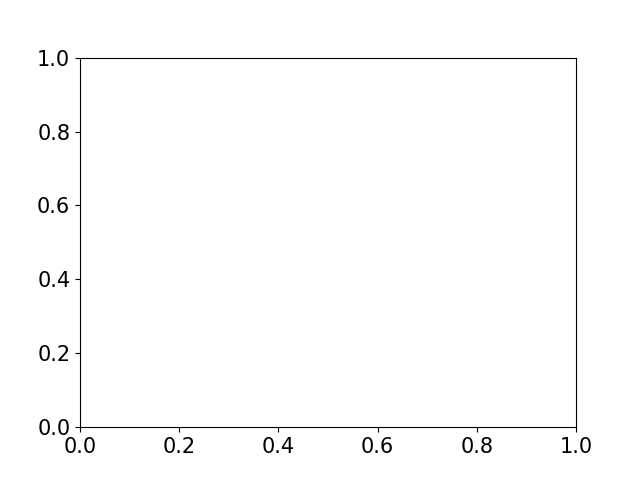

In [386]:
(regenerated_coords, _, regenerated_edge_indices) = model.eval(
    n_steps=50, init_coord=damaged_coord, init_node_feat=final_node_feat, return_inter_states=True)

def animate(t):
    ax.clear()
    # coord2scatter(regenerated_coords[t].detach(), box_dim=box_dim*2, ax=ax, title=get_title(t, regenerated_coords[t]))
    plot_edge_index(regenerated_edge_indices[t], coord=regenerated_coords[t].detach().cpu().numpy(), box_dim=box_dim*2, ax=ax, title=get_title(t, regenerated_coords[t], regenerated_edge_indices[t]))

fig = plt.figure()
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)
ani = animation.FuncAnimation(fig, animate, frames=range(len(regenerated_coords)), interval=250, repeat=False)

In [ ]:
ani.save(f'../results_figures/{model_name}-regenerate.gif', dpi=300, writer=animation.PillowWriter(fps=2))

  0%|          | 0/500 [00:00<?, ?it/s]

100%|██████████| 500/500 [00:02<00:00, 179.79it/s]


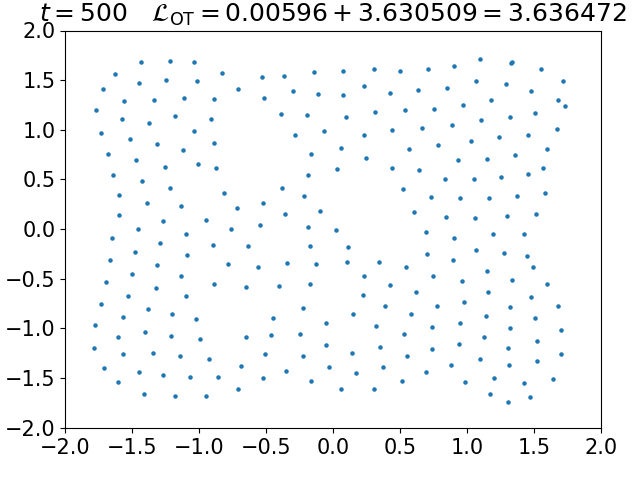

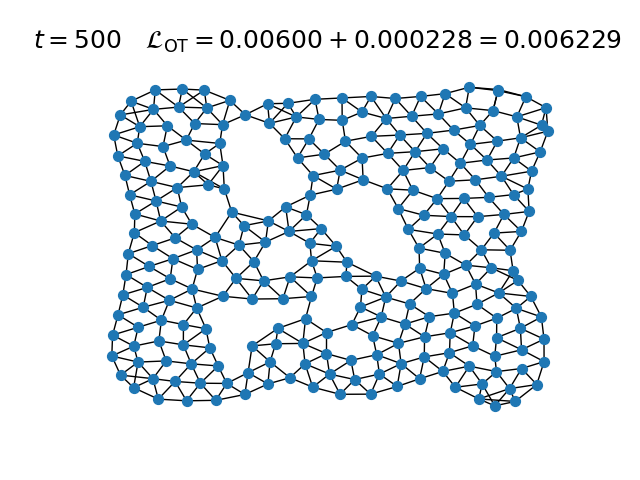

In [387]:
n_regeneration_steps = 500
regenerated_coord, _, regenerated_edge_index = model.eval(n_steps=n_regeneration_steps, init_coord=damaged_coord, init_node_feat=final_node_feat)
coord2scatter(regenerated_coord, box_dim=box_dim * 2, title=get_title(n_regeneration_steps, regenerated_coord))
plot_edge_index(regenerated_edge_index, coord=regenerated_coord.detach().cpu().numpy(), box_dim=box_dim*2, title=get_title(500, regenerated_coord, regenerated_edge_index))

# Node removal

In [24]:
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

C:\Users\20191934\AppData\Local\Temp\ipykernel_20144\912017963.py:3: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  masked_coord = final_coord.clone()[mask]
C:\Users\20191934\AppData\Local\Temp\ipykernel_20144\912017963.py:4: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  masked_feat = final_node_feat.clone()[mask]
  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 50/50 [00:00<00:00, 223.22it/s]


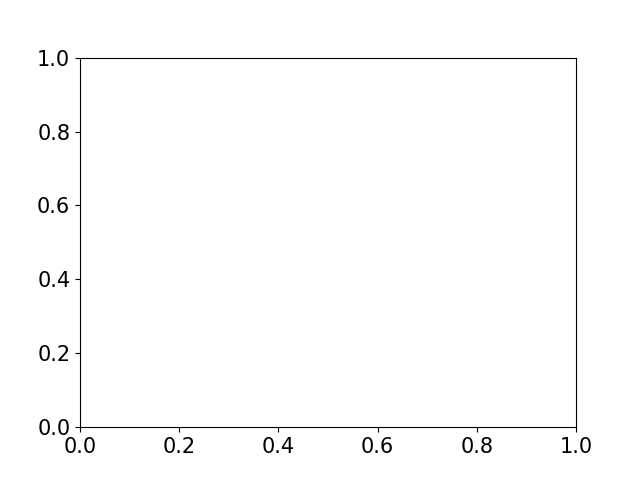

In [388]:
remove_pct = 0.4
mask = (torch.rand(final_coord.size(0)) > remove_pct).byte()
masked_coord = final_coord.clone()[mask]
masked_feat = final_node_feat.clone()[mask]

(regenerated_coords, _, regenerated_edge_indices) = model.eval(n_steps=50, init_coord=masked_coord, init_node_feat=masked_feat, return_inter_states=True)

def animate(t):
    ax.clear()
    # coord2scatter(regenerated_coords[t].detach(), box_dim=box_dim*2, ax=ax)#, title=get_title(t, regenerated_coords[t]))
    plot_edge_index(regenerated_edge_indices[t], coord=regenerated_coords[t].detach().cpu().numpy(), box_dim=box_dim*2, ax=ax, title=get_title(t, regenerated_coords[t], regenerated_edge_indices[t]))

fig = plt.figure()
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)
ani = animation.FuncAnimation(fig, animate, frames=range(len(regenerated_coords)), interval=250, repeat=False)

Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 4 -l local_enp -an --seed 42/version_0/checkpoints/best_model-step=55255.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.5 K     Trainable params
0         Non-trainable params
8.5 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:01<00:00, 31.71it/s]


Loading model: ../log/experiment-resultss/-ds Grid2d -bsc 0 8 2000 16 4000 32 -l local_enp -pd 0.3 -ss -as corners -asc 1.5 -an --seed 42/version_0/checkpoints/best_model-step=9608.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


  0%|          | 0/50 [00:00<?, ?it/s]d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:207: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_coord[anchor_mask] = in_coord[anchor_mask]
d:\Onedrive\OneDrive - TU Eindhoven\Graduation Project\egnca\notebooks\..\models.py:209: UserWarning: indexing with dtype torch.uint8 is now deprecated, please use a dtype torch.bool instead. (Triggered internally at  C:\cb\pytorch_1000000000000\work\aten\src\ATen/native/IndexingUtils.h:28.)
  out_node_feat[anchor_mask] = in_node_feat[anchor_mask]
100%|██████████| 50/50 [00:02<00:00, 23.58it/s]


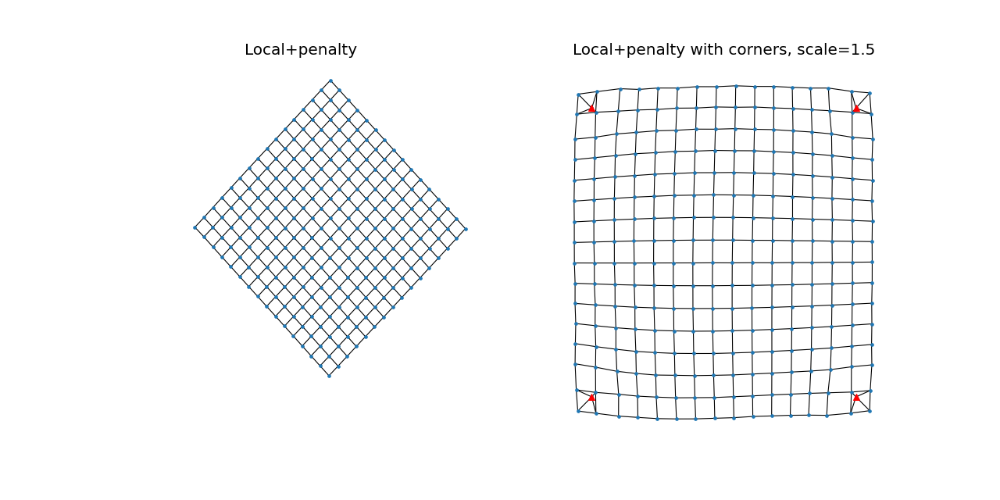

In [390]:
n_steps = 50
show_edges = True

fig = plt.figure(figsize=(16, 8), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(122, projection='3d' if coord_dim == 3 else None)

model_name = '-ds Grid2d -bsc 0 4 -l local_enp -an --seed 42'
get_model(model_name, 0)
final_coord_enp, final_node_feat_enp, final_edge_index_enp = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

model_name = '-ds Grid2d -bsc 0 8 2000 16 4000 32 -l local_enp -pd 0.3 -ss -as corners -asc 1.5 -an --seed 42'
get_model(model_name, 0)
final_coord_enp_ss, final_node_feat_enp_ss, final_edge_index_enp_ss = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

if show_edges:
    plot_edge_index(final_edge_index_enp, coord=final_coord_enp, ax=ax1, title=f'Local+penalty', node_size=10, box_dim=box_dim*3)
    plot_edge_index(final_edge_index_enp_ss, coord=final_coord_enp_ss, ax=ax2, title=f'Local+penalty with corners, scale=1.5', node_size=10, box_dim=box_dim*2, anchor_coords=model.anchor_coords)
else:
    coord2scatter(final_coord_enp, ax=ax1, title=f'Local+penalty', box_dim=box_dim*2)
    coord2scatter(final_coord_enp_ss, ax=ax2, title=f'Local+penalty with corners, scale=1.5', show_anchors=True, anchor_coords=model.anchor_coords, box_dim=box_dim*2)

fig.savefig(f'../result_figures/grid-local-enp-ss_comparison.pdf', dpi=300)

Loading model: -ds x_small -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 8 -me 4 -ed 0.15 -de -des 5 --seed 42
../log/experiment-resultss/-ds x_small -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 8 -me 4 -ed 0.15 -de -des 5 --seed 42/version_0/checkpoints/best_model-step=25056.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.5 K     Trainable params
0         Non-trainable params
5.5 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 600/600 [00:04<00:00, 130.78it/s]


Loading model: -ds a -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 4 -de -des 5 --seed 42
../log/experiment-resultss/-ds a -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 4 -de -des 5 --seed 42/version_0/checkpoints/best_model-step=14921.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.5 K     Trainable params
0         Non-trainable params
5.5 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 1200/1200 [00:06<00:00, 180.61it/s]


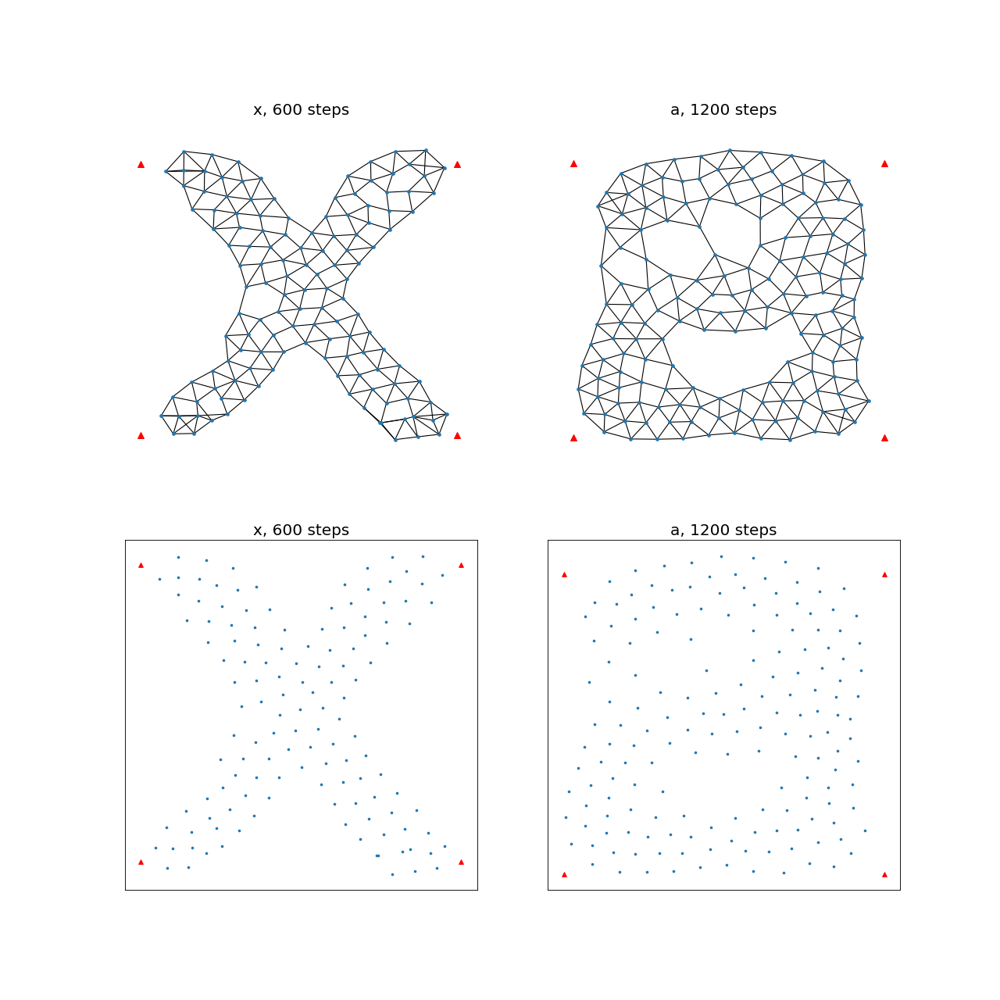

In [302]:
fig = plt.figure(figsize=(16, 16), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(221, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(222, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(223, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(224, projection='3d' if coord_dim == 3 else None)

ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
ax3.set_xticks([])
ax3.set_yticks([])
ax4.set_xticks([])
ax4.set_yticks([])

n_steps = 50 * 12

# x_small
load_model(116, base_path='../log/experiment-resultss', sort='a')
random_init_coord = torch.empty(model.pool.num_nodes, model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
x_coords, x_node_feats, x_edge_index = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=random_init_coord)

# a
load_model(42, base_path='../log/experiment-resultss', sort='a')
random_init_coord = torch.empty(model.pool.num_nodes, model.pool.coord_dim, dtype=dtype).normal_(std=model.pool.std).to(device)
a_coords, a_node_feats, a_edge_index = model.eval(n_steps=n_steps*2, rotate=False, return_inter_states=False, dtype=dtype, init_coord=random_init_coord)

# Edges
plot_edge_index(x_edge_index, coord=x_coords, ax=ax1, title=f'x, {n_steps} steps', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
plot_edge_index(a_edge_index, coord=a_coords, ax=ax2, title=f'a, {n_steps*2} steps', node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

# Coords
coord2scatter(x_coords, ax=ax3, title=f'x, {n_steps} steps', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
coord2scatter(a_coords, ax=ax4, title=f'a, {n_steps*2} steps', show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)

# fig.savefig(f'../result_figures/x-a-comparison-{n_steps}.pdf', dpi=300)

Loading model: -ds a -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 4 -de -des 5 --seed 42
../log/experiment-resultss/-ds a -bsc 0 8 2000 16 -l ot_p -pd 0.2 -pdm 0.1 -bc -as corners -re -en 4 -de -des 5 --seed 42/version_0/checkpoints/best_model-step=14921.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 5.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
5.5 K     Trainable params
0         Non-trainable params
5.5 K     Total params
0.022     Total estimated model params size (MB)


100%|██████████| 500/500 [00:01<00:00, 294.64it/s]


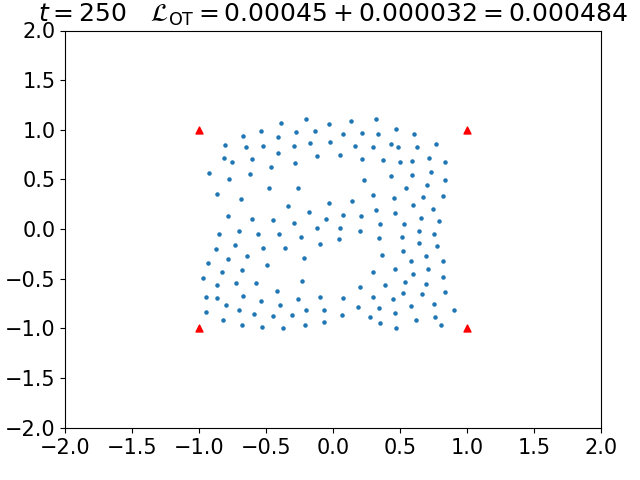

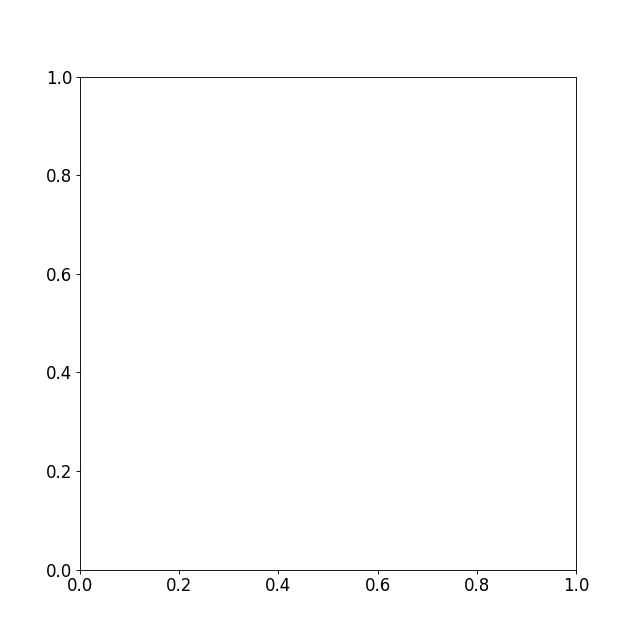

In [276]:
load_model(42, base_path='../log/experiment-resultss', sort='a')

final_coord, final_node_feat, final_edge_index = model.eval(n_steps=250, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

coord2scatter(final_coord, box_dim=box_dim*2, title=get_title(250, final_coord, final_edge_index), zero_center=True, show_anchors=True, anchor_coords=model.anchor_coords)

angle = 2/8 * 2 * np.pi

old_anchor_coords = model.anchor_coords.clone()
rotation = torch.tensor([[np.cos(angle), -np.sin(angle)], [np.sin(angle), np.cos(angle)]], dtype=torch.float64, device=model.device)
inverse_rotation = torch.tensor([[np.cos(-angle), -np.sin(-angle)], [np.sin(-angle), np.cos(-angle)]], dtype=torch.float64, device=model.device)
rotated_beacon = torch.matmul(rotation, model.anchor_coords.T).T
model.anchor_coords = rotated_beacon
model.encoder.beacon_coords = rotated_beacon
for layer in model.encoder.egnn.layers:
    layer.beacon_coords = rotated_beacon

granularity = 10
n_steps = 500

(inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=final_coord, init_node_feat=final_node_feat)

fig = plt.figure(figsize=(8, 8), dpi=80)
fig.tight_layout()
ax = fig.add_subplot(projection='3d' if coord_dim == 3 else None)

def animate(t):
    if t * granularity >= len(inter_coords):
        return
    ax.clear()
    t *= granularity
    # coord2scatter(inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), zero_center=True, show_anchors=True, anchor_coords=rotated_beacon)
    plot_edge_index(inter_edge_index[t], coord=inter_coords[t], box_dim=box_dim*2, ax=ax, title=get_title(t, inter_coords[t], inter_edge_index[t]), node_size=10, anchor_coords=rotated_beacon)

ani = animation.FuncAnimation(fig, animate, frames=range(len(inter_coords) // granularity + 1), interval=100, repeat=False)


Loading model: -ds Grid2d -bsc 0 1 -l local -ss -as corners -an --seed 42
../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l local -ss -as corners -an --seed 42/version_0/checkpoints/best_model-step=79513.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:02<00:00, 19.42it/s]


Loading model: -ds Grid2d -bsc 0 1 -l local -ss -as corners -asc 1.5 -an --seed 42
../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l local -ss -as corners -asc 1.5 -an --seed 42/version_0/checkpoints/best_model-step=39001.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:01<00:00, 28.86it/s]


Loading model: -ds Grid2d -bsc 0 1 -l local -ss -as simplex -an --seed 42
../log/experiment-resultss/-ds Grid2d -bsc 0 1 -l local -ss -as simplex -an --seed 42/version_0/checkpoints/best_model-step=65383.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.5 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.5 K     Trainable params
0         Non-trainable params
8.5 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:01<00:00, 25.95it/s]


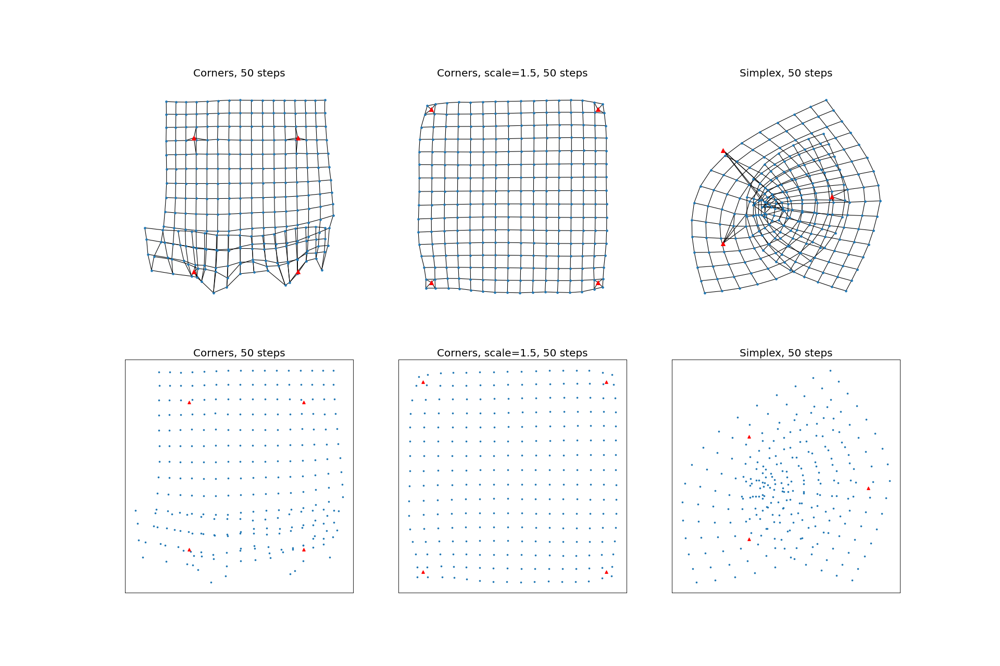

In [389]:
n_steps = 50

fig = plt.figure(figsize=(24, 16), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(231, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(232, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(233, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(234, projection='3d' if coord_dim == 3 else None)
ax5 = fig.add_subplot(235, projection='3d' if coord_dim == 3 else None)
ax6 = fig.add_subplot(236, projection='3d' if coord_dim == 3 else None)

axes = [ax1, ax2, ax3, ax4, ax5, ax6]
for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

load_model(2, base_path='../log/experiment-resultss', sort='a')
final_coord2, final_node_feat2, final_edge_index2 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
model2_n_anchors = model.anchor_feat.size(0)
model2_anchors = model.anchor_coords

load_model(4, base_path='../log/experiment-resultss', sort='a')
final_coord4, final_node_feat4, final_edge_index4 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
model4_n_anchors = model.anchor_feat.size(0)
model4_anchors = model.anchor_coords

load_model(6, base_path='../log/experiment-resultss', sort='a')
final_coord6, final_node_feat6, final_edge_index6 = model.eval(n_steps=n_steps, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
model6_n_anchors = model.anchor_feat.size(0)
model6_anchors = model.anchor_coords

# Edges
plot_edge_index(final_edge_index2, coord=final_coord2, ax=ax1, title=f'Corners, {n_steps} steps', node_size=10, anchor_coords=model2_anchors)
plot_edge_index(final_edge_index4, coord=final_coord4, ax=ax2, title=f'Corners, scale=1.5, {n_steps} steps', node_size=10, anchor_coords=model4_anchors)
plot_edge_index(final_edge_index6, coord=final_coord6, ax=ax3, title=f'Simplex, {n_steps} steps', node_size=10, anchor_coords=model6_anchors)

# Coords
coord2scatter(final_coord2, ax=ax4, title=f'Corners, {n_steps} steps', show_anchors=True, n_anchors=model2_n_anchors)
coord2scatter(final_coord4, ax=ax5, title=f'Corners, scale=1.5, {n_steps} steps', show_anchors=True, n_anchors=model4_n_anchors)
coord2scatter(final_coord6, ax=ax6, title=f'Simplex, {n_steps} steps', show_anchors=True, n_anchors=model6_n_anchors)

fig.savefig(f'../result_figures/local-no_penalty-ss-comparison-{n_steps}.pdf', dpi=300)

Loading model: -ds x -bsc 0 1 -l local_enp -pd 0.15 -ss -as corners -asc 1.5 -an --seed 42
../log/experiment-resultss/-ds x -bsc 0 1 -l local_enp -pd 0.15 -ss -as corners -asc 1.5 -an --seed 42/version_0/checkpoints/best_model-step=50509.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:05<00:00,  9.30it/s]


Loading model: -ds x -bsc 0 1 -l local_enp -pd 0.15 -ss -as corners -asc 1.5 -an --seed 42 -nt nn
../log/experiment-resultss/-ds x -bsc 0 1 -l local_enp -pd 0.15 -ss -as corners -asc 1.5 -an --seed 42 -nt nn/version_0/checkpoints/best_model-step=293.ckpt
  | Name    | Type         | Params
-----------------------------------------
0 | encoder | EncoderEGNCA | 8.6 K 
1 | mse     | MSELoss      | 0     
-----------------------------------------
8.6 K     Trainable params
0         Non-trainable params
8.6 K     Total params
0.034     Total estimated model params size (MB)


100%|██████████| 50/50 [00:06<00:00,  7.68it/s]


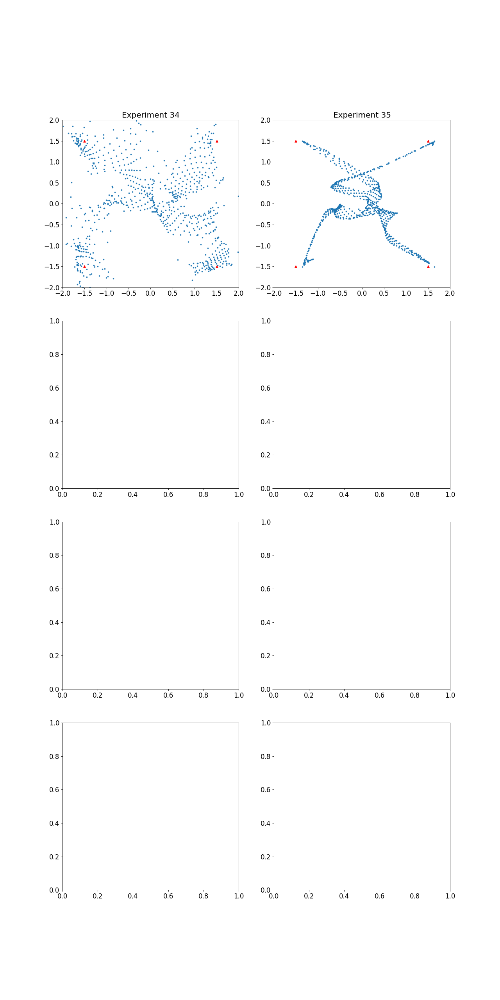

In [357]:
fig = plt.figure(figsize=(16, 32), dpi=80)
fig.tight_layout()

show_edges = False
n_steps = 50

# n_min = 109
# n_max = 116
# n_min = 38
# n_max = 45
# n_min = 2
# n_max = 7
# n_min = 22
# n_max = 26
# n_min = 77
# n_max = 83
# Torus (not working?)
# n_min = 32
# n_max = 33
# Cube
# n_min = 0
# n_max = 1
n_min = 34
n_max = 35

ax1 = fig.add_subplot(421, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(422, projection='3d' if coord_dim == 3 else None)
ax3 = fig.add_subplot(423, projection='3d' if coord_dim == 3 else None)
ax4 = fig.add_subplot(424, projection='3d' if coord_dim == 3 else None)
ax5 = fig.add_subplot(425, projection='3d' if coord_dim == 3 else None)
ax6 = fig.add_subplot(426, projection='3d' if coord_dim == 3 else None)
ax7 = fig.add_subplot(427, projection='3d' if coord_dim == 3 else None)
ax8 = fig.add_subplot(428, projection='3d' if coord_dim == 3 else None)

axes = [ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8]

for i in range(n_min, n_max+1):
    load_model(i, base_path='../log/experiment-resultss', sort='a')
    (inter_coords, inter_node_feats, inter_edge_index) = model.eval(n_steps=n_steps, rotate=False, return_inter_states=True, dtype=torch.float64, init_coord=None, init_node_feat=None)
    ax = axes[i-n_min]
    if show_edges:
        if model.structured_seed:
            plot_edge_index(inter_edge_index[50], coord=inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", node_size=10, anchor_coords=model.anchor_coords)
        elif model.beacon:
            plot_edge_index(inter_edge_index[50], coord=inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", node_size=10, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
        else:
            plot_edge_index(inter_edge_index[50], coord=inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", node_size=10)
    else:
        if model.structured_seed:
            coord2scatter(inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", zero_center=True, show_anchors=True, anchor_coords=model.anchor_coords)
        elif model.beacon:
            coord2scatter(inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", zero_center=True, show_anchors=True, anchor_coords=model.encoder.egnn.layers[0].beacon_coords)
        else:
            coord2scatter(inter_coords[50], box_dim=box_dim*2, ax=ax, title=f"Experiment {i}", zero_center=True)

# fig.savefig('../result_figures/experiment-results.pdf', dpi=300)

In [359]:
path = '../log/geometric_graph/-ds Torus -bsc 0 1 -l local -an -ffa -at undirected -ss -uaf -as corners -ad 0.5/version_0/checkpoints/best_model-step=932.ckpt'
model = FixedTargetGAE.load_from_checkpoint(path).to(device)
coord_dim = model.coord_dim

final_coord, final_node_feat, final_edge_index = model.eval(n_steps=50, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)

coord2scatter(final_coord, box_dim=box_dim*2, title=get_title(50, final_coord, final_edge_index), zero_center=True, show_anchors=True, anchor_coords=model.anchor_coords)

RuntimeError: Error(s) in loading state_dict for FixedTargetGAE:
	Missing key(s) in state_dict: "encoder.anchor_coords", "encoder.egnn.layers.0.ff1.coeff". 
	Unexpected key(s) in state_dict: "init_coord". 
	size mismatch for encoder.egnn.layers.0.edge_mlp2.0.weight: copying a param with shape torch.Size([32, 40]) from checkpoint, the shape in current model is torch.Size([32, 33]).

In [421]:
angles_title

'$t=50$$\\quad \\mathcal{L}_{\\mathsf{INV}}=0.00035$'

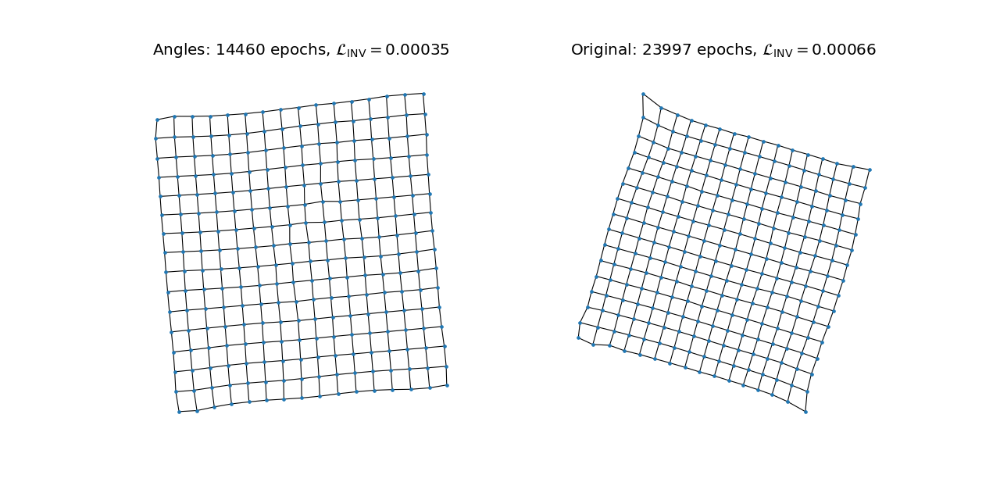

In [425]:
model_angles = '-ds Grid2d -sdg 0.05 -rdg 1.0 -bsc 0 8 2000 16 4000 32 -pats 800 -an --seed 42'
model_orig = '-ds Grid2d -sdg 0.05 -rdg 1.0 -bsc 0 8 2000 16 4000 32 -pats 800 --seed 42'

# get_model(model_angles, 0)
# final_coord_angles, final_node_feat_angles, final_edge_index_angles = model.eval(n_steps=50, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
# angles_title = get_title(50, final_coord_angles, final_edge_index_angles)

# get_model(model_orig, 0)
# final_coord_orig, final_node_feat_orig, final_edge_index_orig = model.eval(n_steps=50, rotate=False, return_inter_states=False, dtype=dtype, init_coord=None)
# orig_title = get_title(50, final_coord_orig, final_edge_index_orig)

fig = plt.figure(figsize=(16, 8), dpi=80)
fig.tight_layout()

ax1 = fig.add_subplot(121, projection='3d' if coord_dim == 3 else None)
ax2 = fig.add_subplot(122, projection='3d' if coord_dim == 3 else None)

plot_edge_index(final_edge_index_angles, coord=final_coord_angles, ax=ax1, title=f'Angles: 14460 epochs, ${angles_title.split(" ")[1]}', node_size=10)
plot_edge_index(final_edge_index_orig, coord=final_coord_orig, ax=ax2, title=f'Original: 23997 epochs, ${orig_title.split(" ")[1]}', node_size=10)

fig.savefig('../result_figures/angles-vs-original.pdf', dpi=300)